<img src="https://raw.githubusercontent.com/callummcdougall/Fundamentals/main/images/resnet.png" width="350">


Colab: [**exercises**](https://colab.research.google.com/drive/1GRAtbOHmy6MHWSoz9AdAam3CUjczB1mo) | [**solutions**](https://colab.research.google.com/drive/1Th-j4FcYWgVTNEGzWjFlSQdPwm4-GbiD)

Please send any problems / bugs on the `#errata` channel in the [Slack group](https://join.slack.com/t/arena-la82367/shared_invite/zt-1uvoagohe-JUv9xB7Vr143pdx1UBPrzQ), and ask any questions on the dedicated channels for this chapter of material.


# [0.3] - ResNets & Model Training


## Introduction


Today's exercises are probably the most directly relevant for the rest of the program out of everything we'll do this week. This is because we'll be looking at important concepts like training loops and neural network architectures. Additionally, the task of assembling a complicated neural network architecture from a set of instructions will lead straight into next week, when we'll be building our own transformers! So forming a deep understanding of everything that's going on in today's exercises will be very helpful going forwards.


## Content & Learning Objectives


### 1️⃣ Building & training a CNN

In part 1, we'll use the modules that we defined in previous exercises to build a basic CNN to classify MNIST images. We'll also learn how to train that CNN, using the very useful **PyTorch Lightning** module.

> ##### Learning Objectives
>
> * Learn how to assemble a convolutional neural network
> * Learn how to train a neural network using PyTorch Lightning
> * Understand the benefit of using libraries like Lightning, which allow us to refactor our code into more modular pieces

### 2️⃣ Assembling ResNet

In part 2, we'll start by defining a few more important modules (e.g. `BatchNorm2d` and `Sequential`), building on our work from yesterday. Then we'll build a much more complex architecture - a **residual neural network**, which uses a special type of connection called **skip connections**. 

> ##### Learning Objectives
> 
> * Learn about batch normalization, and why it is used in training
> * Learn about skip connections, and how they help overcome the degradation problem
> * Assemble your own ResNet, and load in weights from PyTorch's ResNet implementation

### 3️⃣ ResNet feature extraction

In part 3, we'll bring together both of the previous two parts by training our ResNet using PyTorch Lightning.

> ##### Learning Objectives
> 
> * Understand the difference between feature extraction and finetuning
> * Perform feature extraction on a pre-trained ResNet


## Setup (don't read, just run!)


In [4]:
try:
    import google.colab # type: ignore
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    # Install packages
    %pip install torchinfo
    %pip install transformer_lens
    %pip install pytorch-lightning

    # Code to download the necessary files (e.g. solutions, test funcs)
    import os, sys
    if not os.path.exists("chapter0_fundamentals"):
        !wget https://github.com/callummcdougall/ARENA_2.0/archive/refs/heads/main.zip
        !unzip /content/main.zip 'ARENA_2.0-main/chapter0_fundamentals/exercises/*'
        sys.path.append("/content/ARENA_2.0-main/chapter0_fundamentals/exercises")
        os.remove("/content/main.zip")
        os.rename("ARENA_2.0-main/chapter0_fundamentals", "chapter0_fundamentals")
        os.rmdir("ARENA_2.0-main")
        os.chdir("chapter0_fundamentals/exercises")
else:
    from IPython import get_ipython
    ipython = get_ipython()
    ipython.run_line_magic("load_ext", "autoreload")
    ipython.run_line_magic("autoreload", "2")

# Things that need to be done manually

# Nothing

# END

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.9/88.9 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 52.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 86.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 100.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 83.8 MB/s eta 0:00:0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.6/720.6 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 52.3 MB/s eta 0:00:00
--2023-06-11 17:06:44--  https://github.com/callummcdougall/ARENA_2.0/archive/refs/heads/main.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/callummcdougall/ARENA_2.0/zip/refs/heads/main [following]
--2023-06-11 17:06:44--  https://codeload.github.com/callummcdougall/ARENA_2.0/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 20.205.243.165
Connecting to codeload.github.com (codeload.github.com)|20.205.243.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘main.zip’

main

In [1]:
import os; os.environ["ACCELERATE_DISABLE_RICH"] = "1"
import sys
import torch as t
from torch import Tensor
from torch import nn
import torch.nn.functional as F
from collections import OrderedDict
from einops import rearrange
from dataclasses import dataclass
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Subset
from tqdm.notebook import tqdm
from typing import List, Tuple, Dict
from PIL import Image
from IPython.display import display
from pathlib import Path
import torchinfo
import json
import pandas as pd
from jaxtyping import Float, Int
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger

# Make sure exercises are in the path
chapter = r"chapter0_fundamentals"
exercises_dir = Path(f"{os.getcwd().split(chapter)[0]}/{chapter}/exercises").resolve()
section_dir = exercises_dir / "part3_resnets"
if str(exercises_dir) not in sys.path: sys.path.append(str(exercises_dir))
os.chdir(section_dir)

from part2_cnns.solutions import get_mnist, Linear, Conv2d, Flatten, ReLU, MaxPool2d
from part3_resnets.utils import print_param_count
import part3_resnets.tests as tests
from plotly_utils import line, plot_train_loss_and_test_accuracy_from_metrics

device = t.device('cuda' if t.cuda.is_available() else 'cpu')

MAIN = __name__ == "__main__"

import einops

# 1️⃣ Building & Training a CNN


> ##### Learning Objectives
>
> * Learn how to assemble a convolutional neural network
> * Learn how to train a neural network using PyTorch Lightning
> * Understand the benefit of using libraries like Lightning, which allow us to refactor our code into more modular pieces


## ConvNet

We'll be attempting to build the following neural network architecture:


<img src="https://raw.githubusercontent.com/callummcdougall/Fundamentals/main/images/mnist_diagram.png" width="750">


Let's briefly discuss this architecture. We see that it starts with two consecutive stacks of:

* 2D convolution,
* ReLU activation function,
* 2x2 Max pooling

Combining these three in this order (or more generally, convolution + activation function + max pooling) is pretty common, and we'll see it in many more of the architectures we look at going forwards.

Then, we use a `Flatten` (recall the question from yesterday's exercises - we only use `Flatten` after all of our convolutions, because it destroys spatial dependence). Finally, we apply two linear layers to get our output. 

Our network is doing MNIST classification, so this output should represent (in some sense) the strength of our evidence that the input is some particular digit. We can get a prediction by taking the max across this output layer.

We can also represent this network using a diagram:

<img src="https://mermaid.ink/svg/pako:eNp9kUFrwzAMhf-K8bmF1RkjhNFLtsEg60rKTnEPaqw2BscOjj0ySv_77GSFlI35IJ7QJz14PtPaCKQZPVnoGlKUXPf-MDWc5psNp1yT8F5151011seDXbN0YOmeLJdrkhv9WSVDMoo4SxipG9AaVR_bLQgh9YmsJrxE5asSi4-pbWHojFEVGxh5g2EbdFzaOSsFEjZBdbjMbjwe7kn-l8dsd-bHfhsm_zu-KHAO9agLqRGrWMFGcsVSYrwLSfT7KzAf391O370jXKMWdEFbtC1IEfI-x1g5dQ22yGkWpMAjeOVi4JeA-k6Aw2chnbE0O4LqcUHBO7P70jXNnPV4hZ4khB9rf6jLN9JgmcE" width="150">

which is something we'll be using a lot in future exercises, as we deal with more complicated architectures with hierarchically nested components.


### Exercise - creating `ConvNet`

```c
Difficulty: 🟠🟠⚪⚪⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to ~15 minutes on this exercise.
```

Although you're creating a neural network rather than a single layer, this is structurally very similar to the exercises at the end of yesterday when you created `nn.Module` objects to wrap around functions. This time, you're creating an `nn.Module` object to contain the modules of the network. 

Below `__init__`, you should define all of your modules. It's conventional to number them, e.g. `self.conv1 = Conv2d(...)` and `self.linear1 = Linear(...)` (or another common convention is `fc`, for "fully connected"). Below `forward`, you should return the value of sequentially applying all these layers to the input.


In [2]:
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.relu1 = ReLU()
        self.maxpool1 = MaxPool2d(kernel_size=2,padding=0)
        self.conv2 = Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.relu2 = ReLU()
        self.maxpool2 = MaxPool2d(kernel_size=2,padding=0)
        self.flatten = Flatten()
        self.fc1 = Linear(in_features=64*7*7,out_features=128)
        self.relu3 = ReLU()
        self.fc2 = Linear(in_features=128,out_features=10)

    def forward(self, x: t.Tensor) -> t.Tensor:
        x = self.maxpool1(self.relu1(self.conv1(x)))
        x = self.maxpool2(self.relu2(self.conv2(x)))
        x = self.flatten(x)
        # print(x.shape)
        x = self.fc2(self.relu3(self.fc1(x)))
        return x

model = ConvNet()
print(model)

ConvNet(
  (conv1): Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=2, stride=None, padding=0)
  (conv2): Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=2, stride=None, padding=0)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (relu3): ReLU()
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)


Note - rather than defining your network this way, it would be possible to just wrap everything inside an `nn.Sequential`. For simple examples like this, both ways work just fine. However, for more complicated architectures involving nested components and multiple different branches of computation (e.g. the ResNet we'll be building later today), there will be major advantages to building your network in this way.


<details>
<summary>Help - I'm not sure where to start.</summary>

As an example, the first thing you should define in the initialisation section is:
    
```python
self.conv1 = Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
```

Then in the forward loop, the first thing that you call on your input should be:

```python
x = self.conv1(x)
```

After this, it's just a matter of repeating these steps for all the other layers in your model.
</details>

<details>
<summary>Solution</summary>


```python
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()
        # SOLUTION
        
        self.conv1 = Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.relu1 = ReLU()
        self.maxpool1 = MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.conv2 = Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.relu2 = ReLU()
        self.maxpool2 = MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.flatten = Flatten()
        self.fc1 = Linear(in_features=7*7*64, out_features=128)
        self.fc2 = Linear(in_features=128, out_features=10)
        self.relu3 = ReLU()
        
    def forward(self, x: t.Tensor) -> t.Tensor:
        # SOLUTION
        x = self.maxpool1(self.relu1(self.conv1(x)))
        x = self.maxpool2(self.relu2(self.conv2(x)))
        x = self.fc2(self.relu3(self.fc1(self.flatten(x))))
        return x
```
</details>


We can also use the useful library `torchinfo` to print out a much more informative description of our model. You can use this function in two ways:

1. Specify `input_size` (remember the batch dimension!), and optionally `dtypes` (this defaults to float).
2. Specify a sample input tensor, via the argument `input_data`.

Below is an example of the first one:


In [3]:
# summary = torchinfo.summary(model, input_size=(1, 1, 28, 28))
rand_input = t.rand(1, 1, 28, 28)
summary = torchinfo.summary(model, input_data=rand_input)
print(summary)

Layer (type:depth-idx)                   Output Shape              Param #
ConvNet                                  [1, 10]                   --
├─Conv2d: 1-1                            [1, 32, 28, 28]           288
├─ReLU: 1-2                              [1, 32, 28, 28]           --
├─MaxPool2d: 1-3                         [1, 32, 14, 14]           --
├─Conv2d: 1-4                            [1, 64, 14, 14]           18,432
├─ReLU: 1-5                              [1, 64, 14, 14]           --
├─MaxPool2d: 1-6                         [1, 64, 7, 7]             --
├─Flatten: 1-7                           [1, 3136]                 --
├─Linear: 1-8                            [1, 128]                  401,536
├─ReLU: 1-9                              [1, 128]                  --
├─Linear: 1-10                           [1, 10]                   1,290
Total params: 421,546
Trainable params: 421,546
Non-trainable params: 0
Total mult-adds (M): 4.24
Input size (MB): 0.00
Forward/backward pass 

## Transforms, Datasets & DataLoaders

Before we use this model to make any predictions, we first need to think about our input data. Below is a block of code to fetch and process MNIST data. We will go through it line by line.


In [4]:
MNIST_TRANSFORM = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

def get_mnist(subset: int = 1):
    '''Returns MNIST training data, sampled by the frequency given in `subset`.'''
    mnist_trainset = datasets.MNIST(root="./data", train=True, download=True, transform=MNIST_TRANSFORM)
    mnist_testset = datasets.MNIST(root="./data", train=False, download=True, transform=MNIST_TRANSFORM)

    if subset > 1:
        mnist_trainset = Subset(mnist_trainset, indices=range(0, len(mnist_trainset), subset))
        mnist_testset = Subset(mnist_testset, indices=range(0, len(mnist_testset), subset))

    return mnist_trainset, mnist_testset


mnist_trainset, mnist_testset = get_mnist()
mnist_trainloader = DataLoader(mnist_trainset, batch_size=64, shuffle=True)
mnist_testloader = DataLoader(mnist_testset, batch_size=64, shuffle=False)

100%|██████████| 9912422/9912422 [00:00<00:00, 287810814.75it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 40111156.90it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 110243275.41it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 6043949.48it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



The `torchvision` package consists of popular datasets, model architectures, and common image transformations for computer vision. `transforms` is a library from `torchvision` which provides access to a suite of functions for preprocessing data. 

We define a transform for the MNIST data (which is applied to each image in the dataset) by composing `ToTensor` (which converts a `PIL.Image` object into a PyTorch tensor) and `Normalize` (which takes arguments for the mean and standard deviation, and performs the linear transformation `x -> (x - mean) / std)`).


---


Next, we define our datasets, using the `torchvision.datasets` library. The argument `root="./data"` indicates that we're storing our data in the `./data` directory, and `transform=MNIST_TRANSFORM` tells us that we should apply our previously defined `transform` to each element in our dataset.

The `Subset` function allows us to take a subset of a dataset. The argument `indices` is a list of indices to sample from the dataset. For example, `Sample(mnist_trainset, indices=[0, 1, 2])` will return a dataset containing only the first three elements of `mnist_trainset`.


---


Finally, `DataLoader` provides a useful abstraction to work with a dataset. It takes in a dataset, and a few arguments including `batch_size` (how many inputs to feed through the model on which to compute the loss before each step of gradient descent) and `shuffle` (whether to randomise the order each time you iterate). The object that it returns can be iterated through as follows:

```python
for X, y in mnist_trainloader:
    ...
```

where `X` is a 3D array of shape `(batch_size, 28, 28)` where each slice is an image, and `y` is a 1D tensor of labels of length `batch_size`. Without using this helpful object, we'd have to iterate through our dataset as follows:

```python
for i in range(len(mnist_trainset) // batch_size):
    
    X = mnist_trainset.data[i*batch_size: (i+1)*batch_size]
    y = mnist_trainset.targets[i*batch_size: (i+1)*batch_size]

    ...
```

A note about batch size - it's common to see batch sizes which are powers of two. The motivation is for efficient GPU utilisation, since processor architectures are normally organised around powers of 2, and computational efficiency is often increased by having the items in each batch split across processors. Or at least, that's the idea. The truth is a bit more complicated, and some studies dispute whether it actually saves time. We'll dive much deeper into these kinds of topics during the week on training at scale.


---


Before proceeding, try and answer the following questions:


<details>
<summary>Question - can you explain why we include a data normalization function in <code>torchvision.transforms</code> ?</summary>

One consequence of unnormalized data is that you might find yourself stuck in a very flat region of the domain, and gradient descent may take much longer to converge.

Normalization isn't strictly necessary for this reason, because any rescaling of an input vector can be effectively undone by the network learning different weights and biases. But in practice, it does usually help speed up convergence.

Normalization also helps avoid numerical issues.
</details>

<details>
<summary>Question - what is the benefit of using <code>shuffle=True</code> when defining our dataloaders? What might the problem be if we didn't do this?</summary>

Shuffling is done during the training to make sure we aren't exposing our model to the same cycle (order) of data in every epoch. It is basically done to ensure the model isn't adapting its learning to any kind of spurious pattern.
</details>


### Aside - `tqdm`

You might have seen some blue progress bars running when you first downloaded your MNIST data. These were generated using a library called `tqdm`, which is also a really useful tool when training models or running any process that takes a long period of time. 

You can run the cell below to see how these progress bars are used (note that you might need to install the `tqdm` library first).


In [5]:
from tqdm.notebook import tqdm
import time

for i in tqdm(range(100)):
    time.sleep(0.1)

  0%|          | 0/100 [00:00<?, ?it/s]

`tqdm` wraps around a list, range or other iterable, but other than that it doesn't affect the structure of your loop.

One gotcha when it comes to `tqdm` - you need to make sure you pass it something with a well-defined length. For instance, if you pass it an `enumerate` or `zip` object, it won't work as expected because it can't infer length from the object. You can fix this problem by wrapping your iterator in a list (e.g. `tqdm(list(zip(...)))`).


### Aside - `device`

One last thing to discuss before we move onto training our model: **GPUs**. We'll discuss this in a little more detail in the next set of exercises (Training & Optimization). For now, [this page](https://wandb.ai/wandb/common-ml-errors/reports/How-To-Use-GPU-with-PyTorch---VmlldzozMzAxMDk) should provide a basic overview of how to use your GPU. A few things to be aware of here:

* The `to` method is really useful here - it can move objects between different devices (i.e. CPU and GPU) *as well as* changing a tensor's datatype.
    * Note that `to` is never inplace for tensors (i.e. you have to call `x = x.to(device)`), but when working with models, calling `model = model.to(device)` or `model.to(device)` are both perfectly valid.
* Errors from having one device on cpu and another on cuda are very common. Some useful practices to avoid this:
    * Throw in assert statements, to make sure tensors are on the same device
    * Remember that when you initialise an array (e.g. with `t.zeros` or `t.arange`), it will be on CPU by default.
    * Tensor methods like [`new_zeros`](https://pytorch.org/docs/stable/generated/torch.Tensor.new_zeros.html) or [`new_full`](https://pytorch.org/docs/stable/generated/torch.Tensor.new_full.html) are useful, because they'll create tensors which match the device and dtype of the base tensor.

It's common practice to put a line like this at the top of your file, defining a global variable which you can use in subsequent modules and functions (excluding the print statement):


In [6]:
device = t.device('cuda' if t.cuda.is_available() else 'cpu')

# Assuming that we are on a CUDA machine, this should print a CUDA device:
print(device)

cuda


## Training loop


First, let's review our training loop from day 2. It looked like this:


In [7]:
model = ConvNet().to(device)

batch_size = 64
epochs = 3

mnist_trainset, _ = get_mnist(subset = 10)
mnist_trainloader = DataLoader(mnist_trainset, batch_size=64, shuffle=True)

optimizer = t.optim.Adam(model.parameters())
loss_list = []

for epoch in tqdm(range(epochs)):
    for imgs, labels in mnist_trainloader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        logits = model(imgs)
        loss = F.cross_entropy(logits, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss_list.append(loss.item())   # .item() converts single-elem tensor to scalar

  0%|          | 0/3 [00:00<?, ?it/s]

In [8]:
line(
    loss_list, 
    yaxis_range=[0, max(loss_list) + 0.1],
    labels={"x": "Num batches seen", "y": "Cross entropy loss"}, 
    title="ConvNet training on MNIST",
    width=700
)

Let's break down the important parts of this code.

The batch size is the number of samples in each batch (i.e. the number we feed into the model at once). While training our model, we differentiate with respect to the average loss over all samples in the batch (so a smaller batch usually means the loss is more noisy). However, if you're working with large models, then often having a batch size too large will result in a memory error. This will be relevant for models later on in the course, but for now we're working with very small models so this isn't an issue.

Next, we get our training set, via the helper function `get_mnist`. This helper function used `torchvision.datasets.MNIST` to load in data, and then (optionally) the `torch.utils.data.Subset` function to return a subset of this data. Don't worry about the details of this function, it's not the kind of thing you'll need to know by heart.

We then define our optimizer, using `torch.optim.Adam`. The `torch.optim` module gives a wide variety of modules, such as Adam, SGD, and RMSProp. Adam is generally the most popular and seen as the most effective in the majority of cases. We'll discuss optimizers in more detail tomorrow, but for now it's enough to understand that the optimizer calculates the amount to update parameters by (as a function of those parameters' gradients, and sometimes other inputs), and performs this update step. The first argument passed to our optimizer is the parameters of our model (because these are the values that will be updated via gradient descent), and you can also pass keyword arguments to the optimizer which change its behaviour (e.g. the learning rate).

Lastly, we have the actual training loop. We iterate through our training data, and for each batch we:

1. Evaluate our model on the batch of data, to get the logits for our class predictions
2. Calculate the loss between our logits and the true class labels
3. Backpropagate the loss through our model (this step accumulates gradients in our model parameters)
4. Step our optimizer, which is what actually updates the model parameters
5. Zero the gradients of our optimizer, ready for the next step


### Cross entropy loss

The formula for cross entropy loss over a batch of size $N$ is:

$$
\begin{aligned}
l &= \frac{1}{N} \sum_{n=1}^{N} l_n \\ 
l_n &=-\log p_{n, y_{n}}
\end{aligned}
$$

where $p_{n, c}$ is the probability the model assigns to class $c$ for sample $n$, and $y_{n}$ is the true label for this sample.

<details>
<summary>See this dropdown, if you're still confused about this formula, and how this relates to the information-theoretic general formula for cross entropy.</summary>

The cross entropy of a distribution $p$ relate to a distribution $q$ is:

$$
\begin{aligned}
H(q, p) &= -\sum_{n} q(n) \log p(n)
\end{aligned}
$$

In our case, $q$ is the true distribution (i.e. the one-hot encoded labels, which equals one for $n = y_n$, zero otherwise), and $p$ is our model's output. With these subsitutions, this formula becomes equivalent to the formula for $l$ given above.
</details>

<details>
<summary>See this dropdown, if you're confused about how this is the same as the <a href="https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html#torch.nn.CrossEntropyLoss">PyTorch definition</a>.</summary>

The PyTorch definition of cross entropy loss is:

$$
\ell(x, y)=\frac{1}{N}\sum_{n=1}^{N} l_n, \quad l_n=-\sum_{c=1}^C w_c \log \frac{\exp \left(x_{n, c}\right)}{\sum_{i=1}^C \exp \left(x_{n, i}\right)} y_{n, c}
$$

$w_c$ are the weights (which all equal one by default), $p_{n, c} = \frac{\exp \left(x_{n, c}\right)}{\sum_{i=1}^C \exp \left(x_{n, i}\right)}$ are the probabilities, and $y_{n, c}$ are the true labels (which are one-hot encoded, i.e. their value is one at the correct label $c$ and zero everywhere else). With this, the formula for $l_n$ reduces to the one we see above (i.e. the mean of the negative log probabilities).

</details>

The function `torch.functional.cross_entropy` expects the **unnormalized logits** as its first input, rather than probabilities. We get probabilities from logits by applying the softmax function:

$$
\begin{aligned}
p_{n, c} &= \frac{\exp(x_{n, c})}{\sum_{c'=1}^{C} \exp(x_{n, c'})}
\end{aligned}
$$

where $x_{n, c}$ is the model's output for class $c$ and sample $n$, and $C$ is the number of classes (in the case of MNIST, $C = 10$).

Some terminology notes:

* When we say **logits**, we mean the output of the model before applying softmax. We can uniquely define a distribution with a set of logits, just like we can define a distribution with a set of probabilities (and sometimes it's easier to think of a distribution in terms of logits, as we'll see later in the course). 

* When we say **unnormalized**, we mean the denominator term $\sum_{c'} \exp(x_{n, c'})$ isn't necessarily equal to 1. We can add a constant value onto all the logits which makes this term 1 without changing any of the actual probabilities, then we have the relation $p_{n, c} = \exp(-l_{n, c})$. Here, we call $-l_{n, c}$ the **log probabilities** (or log probs), since $-l_{n, c} = \log p_{n, c}$.

If you're interested in the intuition behind cross entropy as a loss function, see [this post on KL divergence](https://www.lesswrong.com/posts/no5jDTut5Byjqb4j5/six-and-a-half-intuitions-for-kl-divergence) (note that KL divergence and cross entropy differ by an amount which is independent of our model's predictions, so minimizing cross entropy is equivalent to minimizing KL divergence). Also see these two videos:

* [Intuitively Understanding the Cross Entropy Loss](https://www.youtube.com/watch?v=Pwgpl9mKars&amp;ab_channel=AdianLiusie)
* [Intuitively Understanding the KL Divergence](https://www.youtube.com/watch?v=SxGYPqCgJWM&amp;ab_channel=AdianLiusie)


## PyTorch Lightning


This training loop is perfectly servicable for the simple task we were trying to do, but it's all a bit cluttered. When we deal with larger models (and with more complex training loops with more moving parts, e.g. validation, early stopping, etc.), it's useful to have a more structured approach to training. This is where [PyTorch Lightning](https://lightning.ai/docs/pytorch/latest/) comes in.

PyTorch Lightning is a library that provides a high-level interface for training PyTorch models. It's designed to remove boilerplate code during a training loop. It's also designed to be compatible with other libraries, such as `wandb` (which we'll look at tomorrow).

Rather than including parts like backpropogation, training step and testing step all within the same loop, it provides a more modular approach. The base module `lightning.pytorch.LightningModule` defines a full system (which includes a model and a protocol for training it). The two most important methods when using this module are:

* `training_step` - defines what happens during a training step (for a single batch)
    * This is the most important method
    * It covers steps 1 and 2 from the training loop outlined above (steps 3, 4 and 5 are handled automatically)
    * It should return the calculated loss
    * You can also log variables, using the `self.log_dict` method
    * Note that we can omit the step `imgs = imgs.to(device)`, because Lightning automatically moves the data to the correct device
* `configure_optimizers` - defines the optimizer(s) used during training. 

These are the only two methods that **every** PyTorch Lightning training loop needs, although most of the time we also define a few other methods, including:

* `forward`, to set the default behaviour of a forward pass (just like for a regular `nn.Module`). If we do this, it allows us to use `self(x)` as a forward pass in other methods (e.g. `training_step`, see below).
* `train_dataloader`, which defines the training and validation dataloaders respectively. These are called automatically by `lightning.pytorch.Trainer` (see below) when we call the `fit` method.

<details>
<summary>Technical details - what is happening under the hood?</summary>

Under the hood, when you train your model using `lightning.pytorch.Trainer` and the `fit` method (see below), the following loop will be called:

```python
model = LitModule()
optimizer = model.configure_optimizers()

for batch_idx, batch in enumerate(train_dataloader):
    loss = model.training_step(batch, batch_idx)

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
```

Note - `LightningModule` inherits from `torch.nn.Module`, which is why you can call things like `self.parameters()` rather than `self.convnet.parameters()` in the code below.

</details>

There are also a number of other methods which you can define to override the default behaviour of the training loop in other ways (e.g. validation sets, early stopping, saving and loading from checkpoints, GPU utilization). We'll look at some of these later on, but for now you don't need to worry about them.

We've added docstrings for the methods below, but if you remove the docstrings and hover over the methods (in VSCode) then you can see the original library docstrings which contain more information.


In [9]:
import pytorch_lightning as pl
from pytorch_lightning.loggers import CSVLogger


class LitConvNet(pl.LightningModule):
    def __init__(self, batch_size: int, max_epochs: int, subset: int = 10):
        super().__init__()
        self.convnet = ConvNet()
        self.batch_size = batch_size
        self.max_epochs = max_epochs
        self.trainset, self.testset = get_mnist(subset = 10)

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Here you should define the forward pass of your model.
        '''
        return self.convnet(x)

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> t.Tensor:
        '''
        Here you compute and return the training loss and some additional metrics for e.g. the progress bar or logger.
        '''
        imgs, labels = batch
        logits = self(imgs)
        loss = F.cross_entropy(logits, labels)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        '''
        Choose what optimizers and learning-rate schedulers to use in your optimization.
        '''
        optimizer = t.optim.Adam(self.parameters())
        return optimizer
    
    def train_dataloader(self):
        '''
        Return the training dataloader.
        '''
        return DataLoader(self.trainset, batch_size=self.batch_size, shuffle=True)

Once you've created this class, you can use the `Trainer` class to train your model. Example code is provided below, which you should run. Don't worry about understanding all the logging text which gets printed when you run.


In [10]:
# Create the model & training system
batch_size = 64
max_epochs = 3
model = LitConvNet(batch_size=batch_size, max_epochs=max_epochs)

# Get a logger, to record metrics during training
logger = CSVLogger(save_dir=os.getcwd() + "/logs", name="day4-convenet")

# Train the model (hint: here are some helpful Trainer arguments for rapid idea iteration)
trainer = pl.Trainer(
    max_epochs=max_epochs,
    logger=logger,
    log_every_n_steps=1,
)
trainer.fit(model=model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type    | Params
------------------------------------
0 | convnet | ConvNet | 421 K 
------------------------------------
421 K     Trainable params
0         Non-trainable params
421 K     Total params
1.686     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


Note the `max_epochs` argument, which causes the training loop to finish after a certain number of eopchs. We can also use `max_steps`, or even `max_time` (although this is more common when you're testing or debugging your model).

Also note the use of the `logger` object, defined using `lightning.pytorch.loggers.CSVLogger`. This will save our logged metrics, in the csv file given by `[save_dir]/[name]/version_[version]/metrics.csv`, where `version` is an integer that gets incremented each time you save new data. The argument `log_every_n_steps` determines the logging frequency (step is synonymous with batch). We can access the logged data using:


In [11]:
metrics = pd.read_csv(f"{trainer.logger.log_dir}/metrics.csv")

metrics.head()

,train_loss,epoch,step
0,2.310276,0,0
1,2.318133,0,1
2,2.210634,0,2
3,2.137455,0,3
4,2.053418,0,4


Now let's plot the results:


In [12]:
line(
    metrics["train_loss"].values,
    x=metrics["step"].values,
    yaxis_range=[0, metrics["train_loss"].max() + 0.1],
    labels={"x": "Batches seen", "y": "Cross entropy loss"},
    title="ConvNet training on MNIST",
    width=800,
    hovermode="x unified",
    template="ggplot2", # alternative aesthetic for your plots (-:
)


Finally, we'll now build our training loop. The one below is actually constructed for you rather than left as an exercise, but you should make sure that you understand the purpose of every line below, because soon you'll be adding to it, and making your own training loops for different architectures.


You should find the results to be much better than the results we got from our earlier models. It might take longer to get to the same loss, but it will eventually get much lower than the previous model would be able to.


### Aside - `dataclasses`

Sometimes, when we have a lot of different input parameters to our model, it can be helpful to use dataclasses to keep track of them all. Dataclasses are a special kind of class which come with built-in methods for initialising and printing (i.e. no need to define an `__init__` or `__repr__`). Another advantage of using them is autocompletion: when you type in `args.` in VSCode, you'll get a dropdown of all your different dataclass attributes, which can be useful when you've forgotten what you called a variable!

Here's an example of how we might rewrite our training code above using dataclasses:


In [13]:
@dataclass
class ConvNetTrainingArgs():
    '''
    Defining this class implicitly creates an __init__ method, which sets arguments as 
    given below, e.g. self.batch_size = 64. Any of these arguments can also be overridden
    when you create an instance, e.g. args = ConvNetTrainingArgs(batch_size=128).
    '''
    batch_size: int = 64
    max_epochs: int = 3
    optimizer: t.optim.Optimizer = t.optim.Adam
    learning_rate: float = 1e-3
    log_dir: str = os.getcwd() + "/logs"
    log_name: str = "day3-convenet"
    log_every_n_steps: int = 1
    sample: int = 10


class LitConvNet(pl.LightningModule):
    def __init__(self, args: ConvNetTrainingArgs):
        super().__init__()
        self.convnet = ConvNet()
        self.args = args
        self.trainset, self.testset = get_mnist(subset=args.sample)

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> t.Tensor:
        imgs, labels = batch
        logits = self.convnet(imgs)
        loss = F.cross_entropy(logits, labels)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        return self.args.optimizer(self.parameters(), lr=self.args.learning_rate)
    
    def train_dataloader(self):
        return DataLoader(self.trainset, batch_size=self.args.batch_size, shuffle=True)
    

args = ConvNetTrainingArgs()
model = LitConvNet(args)
logger = CSVLogger(save_dir=args.log_dir, name=args.log_name)

trainer = pl.Trainer(
    max_epochs=args.max_epochs,
    logger=logger,
    log_every_n_steps=1
)
trainer.fit(model=model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type    | Params
------------------------------------
0 | convnet | ConvNet | 421 K 
------------------------------------
421 K     Trainable params
0         Non-trainable params
421 K     Total params
1.686     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [14]:
metrics = pd.read_csv(f"{trainer.logger.log_dir}/metrics.csv")

metrics.head()

line(
    metrics["train_loss"].values,
    x=metrics["step"].values,
    yaxis_range=[0, metrics["train_loss"].max() + 0.1],
    labels={"x": "Batches seen", "y": "Cross entropy loss"},
    title="ConvNet training on MNIST",
    width=800,
    hovermode="x unified",
    template="ggplot2", # alternative aesthetic for your plots (-:
)

Note that PyTorch has its own functions for saving and loading models (`torch.save` and `torch.load`), these are called under the hood by Lightning.

> Tip - you can set a random seed in a robust way (useful for reproducibility) with PyTorch Lightning, via `pl.seed_everything(seed: int)`. This will set the seed for the random number generators used by PyTorch, NumPy and Python's built-in random module. 


### Exercise - add a validation loop

```c
Difficulty: 🟠🟠🟠⚪⚪
Importance: 🟠🟠🟠🟠🟠

You should spend up to ~20 minutes on this exercise.

It is very important that you understand PyTorch Lightning training loops and how they work, because we'll be doing a lot of model training with this library.
```

Edit the `LitConvNet` class above to include a testing loop. Run a testing loop, and plot the test accuracy.

The method is called `validation_step`. It takes the same arguments as `training_step`, and follows the same basic structure (run the model, get the test accuracy, and log it). We don't need to return the loss (because we don't need to do backpropagation on it), logging is the only important thing. Note that variables logged by `validation_step` are automatically averaged over the validation set. This means that if you log the accuracy for each batch, this will end up giving you a single row in your metrics dataframe, representing the the average accuracy over all batches in the validation set.

You should also add a `val_dataloader` function (which works exactly the same as `train_dataloader`).

<details>
<summary>Terminology note - validation vs testing</summary>

PyTorch Lightning follows the convention of distinguishing between validation and testing. Validation is done during training (typically after each epoch), and is used for tracking model performance in an unbiased way. It can help with selecting the best hyperparameters (see tomorrow's material for more on this). Testing is done only once we're satisfied with training and we want to see how our model will perform.

However, most of the time in this course we won't be discussing testing, and when we use language like "test dataset" this will refer to the dataset we use for the validation step.
</details>

<details>
<summary>Technical details - what is happening under the hood?</summary>

Under the hood, when you train your model using `lightning.pytorch.Trainer` (see below), the following loop will be called:

```python
model = LitModule()
optimizer = model.configure_optimizers()

train_dataloader = model.train_dataloader()
val_dataloader = model.val_dataloader()

for batch_idx, batch in enumerate(train_dataloader):
    loss = model.training_step(batch, batch_idx)

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    if validate_at_some_point:
        # disable grads + batchnorm + dropout
        torch.set_grad_enabled(False)
        model.eval()

        # ----------------- VAL LOOP ---------------
        for val_batch_idx, val_batch in enumerate(val_dataloader):
            val_out = model.validation_step(val_batch, val_batch_idx)
        # ----------------- VAL LOOP ---------------

        # enable grads + batchnorm + dropout
        torch.set_grad_enabled(True)
        model.train()
```

The `train` and `eval` methods chagne the behaviour of certain types of layer in the model. We'll discuss them more in the next section (when we implement batch norm). The `torch.set_grad_enabled` function is a global variable which determines whether we propagate gradients in our model (if we're evaluting our model rather than training it, then it's a waste of compute and memory to calculate and store gradients).

</details>

Your test accuracy should be the number of correct classifications on the dataset.

<details>
<summary>Help - I'm not sure how to measure correct classifications.</summary>

You can take argmax of the output of your model, using `torch.argmax` (with the keyword argument `dim` to specify the dimension you want to take max over).

Note that you don't need to calculate probabilities via softmax before getting classifications, since softmax is order-preserving (the highest logit will also be the highest probability).
</details>


#### A note on reusing code

In situations like this one, the `training_step` and `validation_step` functions will have some shared code (and if we added a `test_step` this would have even more shared code). It's generally good coding practice to remove repetition. In situations like this, the best thing to do is define a new method which does the shared part of the computation, and have `training_step` and `validation_step` both call this function. It's also common to prefix methods like this with a single underscore `_` (e.g. `_shared_train_val_step`). This doesn't change the method's behaviour (unlike using a double underscore, e.g. methods like `__init__`), but it's a convention to indicate that the method is private and shouldn't be called directly.

Note that using a function like this to reduce duplicated code doesn't actually shorten our code by much in this case, but it'll be a lot more helpful in later situations where there's more boilerplate involved in a forward pass.


In [15]:
class LitConvNetTest(pl.LightningModule):
    def __init__(self, args: ConvNetTrainingArgs):
        super().__init__()
        self.convnet = ConvNet()
        self.args = args
        self.trainset, self.testset = get_mnist(subset=args.sample)

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.convnet(x)

    def _shared_train_val_step(self, batch: Tuple[Tensor, Tensor]) -> Tuple[Tensor, Tensor]:
        imgs,labels = batch
        logits = self(imgs)
        return logits,labels

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> Tensor:
        logits,labels = self._shared_train_val_step(batch)
        loss = F.cross_entropy(logits,labels)
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> None:
        logits,labels = self._shared_train_val_step(batch)
        pred = t.argmax(logits,dim=-1) # [batch, logits] -> [batch]
        correct_classifications = t.sum(pred==labels)
        batch_size = labels.shape[0]
        percent_correct = correct_classifications / batch_size
        self.log("accuracy", percent_correct)
        # No need to return this

    def configure_optimizers(self):
        return self.args.optimizer(self.parameters(), lr=self.args.learning_rate)
    
    def train_dataloader(self):
        return DataLoader(self.trainset, batch_size=self.args.batch_size, shuffle=True)
    
    def val_dataloader(self):
        return DataLoader(self.testset, batch_size=self.args.batch_size, shuffle=False)

args = ConvNetTrainingArgs()
model = LitConvNetTest(args)
logger = CSVLogger(save_dir=args.log_dir, name=args.log_name)

trainer = pl.Trainer(
    max_epochs=args.max_epochs,
    logger=logger,
    log_every_n_steps=args.log_every_n_steps
)
trainer.validate(model=model)
trainer.fit(model=model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         accuracy          │    0.06400000303983688    │
└───────────────────────────┴───────────────────────────┘

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type    | Params
------------------------------------
0 | convnet | ConvNet | 421 K 
------------------------------------
421 K     Trainable params
0         Non-trainable params
421 K     Total params
1.686     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


<details>
<summary>Help - I get <code>RuntimeError: expected scalar type Float but found Byte</code>.</summary>

This is commonly because one of your operations is between tensors with the wrong datatypes (e.g. `int` and `float`). Try navigating to the error line and checking your dtypes (or using VSCode's built-in debugger).
</details>

<details>
<summary>Solution</summary>


```python
class LitConvNetTest(pl.LightningModule):
    def __init__(self, args: ConvNetTrainingArgs):
        super().__init__()
        self.convnet = ConvNet()
        self.args = args
        self.trainset, self.testset = get_mnist(subset=args.sample)

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.convnet(x)

    def _shared_train_val_step(self, batch: Tuple[Tensor, Tensor]) -> Tuple[Tensor, Tensor]:
        # SOLUTION
        imgs, labels = batch
        logits = self(imgs)
        return logits, labels

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> Tensor:
        # SOLUTION
        logits, labels = self._shared_train_val_step(batch)
        loss = F.cross_entropy(logits, labels)
        self.log("train_loss", loss)
        return loss
    
    def validation_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> None:
        # SOLUTION
        logits, labels = self._shared_train_val_step(batch)
        classifications = logits.argmax(dim=1)
        accuracy = t.sum(classifications == labels) / len(classifications)
        self.log("accuracy", accuracy)

    def configure_optimizers(self):
        return self.args.optimizer(self.parameters(), lr=self.args.learning_rate)
    
    def train_dataloader(self):
        return DataLoader(self.trainset, batch_size=self.args.batch_size, shuffle=True)
    
    def val_dataloader(self):
        # SOLUTION
        return DataLoader(self.testset, batch_size=self.args.batch_size, shuffle=True)
```
</details>


Now let's read and plot our results:


In [16]:
metrics = pd.read_csv(f"{trainer.logger.log_dir}/metrics.csv")

plot_train_loss_and_test_accuracy_from_metrics(metrics, "Training ConvNet on MNIST data")

Note - it might not look obvious how the test accuracy is increasing from this graph, because of the y-axis scale. If you want to plot the test accuracy at the very start, you can add a call `trainer.validate()` before `trainer.fit()` (this will call one validation loop before it starts the cycle of `max_epochs` training and validation loops).

```python
trainer = pl.Trainer(...)
trainer.validate(model=model)
trainer.fit(model=model)
```


You should find that after the first epoch, the model is already doing much better than random chance (>95%), and it improves slightly in subsequent epochs.


### A note on modular code


In this section, we used PyTorch Lightning to refactor our code, and make it more modular. Writing modular code is a good habit to get into, and it's something that will become more relevant as you go through this course and take deeper dives on more complex, open-ended projects.

Making code modular involves breaking down complex systems into smaller, self-contained units, known as modules. Each module is responsible for a specific functionality and can be developed, tested, and maintained independently. Some benefits of modularity include:

* Simplifying your codebase by making it more readable and manageable.
* Enhancing collaboration, because if you're working in a team then team members can work on separate modules simultaneously without interfering with each other's progress.
* Promoting reusability, as modules can be reused across different parts of the same project (or even different projects).

For instance, when you get to writing training loops for our transformer models next week, you'll be returning to the code we wrote today! You'll find it much easier to repurpose this code for training a language model than you would if it was written in a single, monolithic function using just vanilla PyTorch.


## Bonus - Using Transforms for Data Augmentation

*You should come back to these exercises at the end of today, if you have time.*

Data augmentation is a technique used to increase the amount of training data by applying various transformations to the original dataset. This can help improve the performance of the model, especially when you have limited training data. Data augmentation can also improve the robustness of the model by exposing it to different variations of the input data, making the model generalize better to unseen data.

Some commonly used data augmentation techniques include:

1. Rotation - rotating the image by a certain angle.
2. Scaling - resizing the image.
3. Flipping - reflecting the image horizontally or vertically.
4. Translation - shifting the image horizontally or vertically.
5. Cropping - taking a random crop from the image.

Here's an example of some of these transformations, using `torchvision.transforms`:


In [17]:
data_augmentation_transform = transforms.Compose([
   transforms.RandomRotation(degrees=15),
   transforms.RandomResizedCrop(size=28, scale=(0.8, 1.2)),
   transforms.RandomHorizontalFlip(p=0.5),
   transforms.RandomVerticalFlip(p=0.5),
   transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
   transforms.ToTensor(),
   transforms.Normalize((0.1307,), (0.3081,))
])

Now we can update the `get_mnist` function to incorporate data augmentation for the training dataset:


In [18]:
def get_mnist_augmented(subset: int = 1, train_transform=None, test_transform=None):
    if train_transform is None:
        train_transform = MNIST_TRANSFORM
    if test_transform is None:
        test_transform = MNIST_TRANSFORM
    mnist_trainset = datasets.MNIST(root="./data", train=True, download=True, transform=train_transform)
    mnist_testset = datasets.MNIST(root="./data", train=False, download=True, transform=test_transform)
    if subset > 1:
        mnist_trainset = Subset(mnist_trainset, indices=range(0, len(mnist_trainset), subset))
        mnist_testset = Subset(mnist_testset, indices=range(0, len(mnist_testset), subset))
    return mnist_trainset, mnist_testset

By applying data augmentation, we can improve the model's performance with limited data and enhance its ability to generalize to new data. Note that data augmentation is typically applied only to the training dataset, as it helps the model learn more generalized features from the artificially augmented data. The test dataset should remain unchanged to provide an unbiased evaluation of the model performance.

**Challenge - how good test accuracy can you get using data augmentation, for a fixed size of training set (e.g. 100, 1000, ...?).**


# 2️⃣ Assembling ResNet


> ##### Learning Objectives
> 
> * Learn about batch normalization, and why it is used in training
> * Learn about skip connections, and how they help overcome the degradation problem
> * Assemble your own ResNet, and load in weights from PyTorch's ResNet implementation


## Reading

* [Batch Normalization in Convolutional Neural Networks](https://www.baeldung.com/cs/batch-normalization-cnn)
* [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf)

You should move on once you can answer the following questions:


<details>
<summary>"Batch Normalization allows us to be less careful about initialization." Explain this statement.</summary>

Weight initialisation methods like Xavier (which we encountered yesterday) are based on the idea of making sure the activations have approximately the same distribution across layers at initialisation. But batch normalisation ensures that this is the case as signals pass through the network.
</details>

<details>
<summary>Give three reasons why batch norm improves the performance of neural networks.</summary>

The reasons given in the first linked document above are:
    * Normalising inputs speeds up computation
* Internal covariate shift is reduced, i.e. the mean and standard deviation is kept constant across the layers.
* Regularisation effect: noise internal to each minibatch is reduced
</details>

<details>
<summary>If you have an input tensor of size (batch, channels, width, height), and you apply a batchnorm layer, how many learned parameters will there be?</summary>

A mean and standard deviation is calculated for each channel (i.e. each calculation is done across the batch, width, and height dimensions). So the number of learned params will be `2 * channels`.
</details>

<details>
<summary>In the paper, the diagram shows additive skip connections (i.e. F(x) + x). One can also form concatenated skip connections, by "gluing together" F(x) and x into a single tensor. Give one advantage and one disadvantage of these, relative to additive connections.</summary>

One advantage of concatenation: the subsequent layers can re-use middle representations; maintaining more information which can lead to better performance. Also, this still works if the tensors aren't exactly the same shape. One disadvantage: less compact, so there may be more weights to learn in subsequent layers.

Crucially, both the addition and concatenation methods have the property of preserving information, to at least some degree of fidelity. For instance, you can [use calculus to show](https://theaisummer.com/skip-connections/#:~:text=residual%20skip%20connections.-,ResNet%3A%20skip%20connections%C2%A0via%C2%A0addition,-The%20core%20idea) that both methods will fix the vanishing gradients problem.
</details>


In this section, we'll do a more advanced version of the exercise in part 1. Rather than building a relatively simple network in which computation can be easily represented by a sequence of simple layers, we're going to build a more complex architecture which requires us to define nested blocks.

We'll start by defining a few more `nn.Module` objects, which we hadn't needed before.


## Sequential

Firstly, now that we're working with large and complex architectures, we should create a version of `nn.Sequential`. Recall that we briefly came across `nn.Sequential` at the end of the first day, when building our (extremely simple) neural network. As the name suggests, when an `nn.Sequential` is fed an input, it sequentially applies each of its submodules to the input, with the output from one module feeding into the next one.

The implementation is given to you below. A few notes:

* In initalization, we add to the `_modules` dictionary.
    * This is a special type of dict called an **ordered dictionary**, which preserves the order of elements that get added (although Python sort-of does this now by default).
    * When we call `self.parameters()`, this recursively goes through all modules in `self._modules`, and returns the params in those modules. This means we can nest sequentials within sequentials!
* The special `__getitem__` and `__setitem__` methods determine behaviour when we get and set modules within the sequential.
* The `repr` of the base class `nn.Module` already recursively prints out the submodules, so we don't need to write anything in `extra_repr`.
    * To see how this works in practice, try defining a `Sequential` which takes a sequence of modules that you've defined above, and see what it looks like when you print it.

Don't worry about deeply understanding this code. The main takeaway is that `nn.Sequential` is a useful list-like object to store modules, and apply them all sequentially.

<details>
<summary>Aside - initializing Sequential with an OrderedDict</summary>

The actual `nn.Sequential` module can be initialized with an ordered dictionary, rather than a list of modules. For instance, rather than doing this:

```python
seq = nn.Sequential(
    nn.Linear(10, 20),
    nn.ReLU(),
    nn.Linear(20, 30)
)
```

we can do this:

```python
seq = nn.Sequential(OrderedDict([
    ("linear1", nn.Linear(10, 20)),
    ("relu", nn.ReLU()),
    ("linear2", nn.Linear(20, 30))
]))
```

This is handy if we want to give each module an descriptive name.

The `Sequential` implementation below doesn't allow the input to be an OrderedDict. As a bonus exercise, can you rewrite the `__init__`, `__getitem__` and `__setitem__` methods to allow the input to be an OrderedDict?

</details>


In [19]:
class Sequential(nn.Module):
    _modules: Dict[str, nn.Module]

    def __init__(self, *modules: nn.Module):
        super().__init__()
        for index, mod in enumerate(modules):
            self._modules[str(index)] = mod

    def __getitem__(self, index: int) -> nn.Module:
        index %= len(self._modules) # deal with negative indices
        return self._modules[str(index)]

    def __setitem__(self, index: int, module: nn.Module) -> None:
        index %= len(self._modules) # deal with negative indices
        self._modules[str(index)] = module

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''Chain each module together, with the output from one feeding into the next one.'''
        for mod in self._modules.values():
            x = mod(x)
        return x

## BatchNorm2d

Now, we'll implement our `BatchNorm2d`, the layer described in the documents you hopefully read above.

Something which might have occurred to you as you read about batch norm - how does it work when in inference mode? It makes sense to normalize over a batch of multiple input data, but normalizing over a single datapoint doesn't make any sense! This is why we have to introduce a new PyTorch concept: **buffers**.

Unlike `nn.Parameter`, a buffer is not its own type and does not wrap a `Tensor`. A buffer is just a regular `Tensor` on which you've called [self.register_buffer](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.register_buffer) from inside a `nn.Module`. As an example, `self.register_buffer("variable_name", t.zeros(10))` will define an object `self.variable_name` and register it as a buffer.

What is a buffer, and why is it different to a standard attribute or to a `nn.Parameter` object? The differences are as follows:

* It is normally included in the output of `module.state_dict()`, meaning that `torch.save` and `torch.load` will serialize and deserialize it.
* It is moved between devices when you call `model.to(device)`.
* It is not included in `module.parameters`, so optimizers won't see or modify it. Instead, your module will modify it as appropriate within `forward`.


### Train and Eval Modes

This is your first implementation that needs to care about the value of `self.training`, which is set to True by default, and can be set to False by `self.eval()` or to True by `self.train()`.

In training mode, you should use the mean and variance of the batch you're on, but you should also update a stored `running_mean` and `running_var` on each call to `forward` using the "momentum" argument as described in the PyTorch docs. Your `running_mean` shuld be intialized as all zeros; your `running_var` should be initialized as all ones. Also, you should keep track of `num_batches_tracked`.

<details>
<summary>Aside on <code>num_batches_tracked</code> (optional, unimportant)</summary>

PyTorch uses this to calculate momentum for calculation of the moving averages in the event that the module is intialized with `momentum=None`, although you don't need to worry about this because you can assume that the momentum parameter will always be a float in our use cases; we're just keeping track of `num_batches_tracked` to be consistent with PyTorch's version of BatchNorm2d, and to make sure that our state dictionaries have the same items.

</details>

In eval mode, you should use the running mean and variance that you stored before (not the mean and variance from the current batch).


### Exercise - implement `BatchNorm2d`

```c
Difficulty: 🟠🟠🟠🟠⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to 20-25 minutes on this exercise.

This is probably the most challenging module you'll have implemented so far. Getting all the dimensions and operations right can be tricky.
```

Implement `BatchNorm2d` according to the [PyTorch docs](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html). Call your learnable parameters `weight` and `bias` for consistency with PyTorch.


In [20]:
class BatchNorm2d(nn.Module):
    # The type hints below aren't functional, they're just for documentation
    running_mean: Float[Tensor, "num_features"]
    running_var: Float[Tensor, "num_features"]
    num_batches_tracked: Int[Tensor, ""] # This is how we denote a scalar tensor

    def __init__(self, num_features: int, eps=1e-05, momentum=0.1):
        '''
        Like nn.BatchNorm2d with track_running_stats=True and affine=True.

        Name the learnable affine parameters `weight` and `bias` in that order.
        '''
        super().__init__()
        self.num_features,self.eps,self.momentum = num_features,eps,momentum
        self.register_buffer("running_mean",t.zeros(num_features))
        self.register_buffer("running_var",t.ones(num_features))
        self.register_buffer("num_batches_tracked",t.tensor(0))
        self.weight = nn.Parameter(t.ones(num_features))
        self.bias = nn.Parameter(t.zeros(num_features))

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Normalize each channel.

        Compute the variance using `torch.var(x, unbiased=False)`
        Hint: you may also find it helpful to use the argument `keepdim`.

        x: shape (batch, channels, height, width)
        Return: shape (batch, channels, height, width)
        '''
        if self.training:
          mean = t.mean(x,dim=(0,2,3),keepdim=True)
          var = t.var(x,dim=(0,2,3),keepdim=True)
          # mean = einops.reduce(x,'b c h w -> c','mean')
          # var = einops.reduce(x,'b c h w -> c','var')
          self.num_batches_tracked += 1
          self.running_mean = (1-self.momentum)*self.running_mean + self.momentum*mean.squeeze()
          self.running_var = (1-self.momentum)*self.running_var + self.momentum*var.squeeze()
        else:
          mean = rearrange(self.running_mean,'c -> 1 c 1 1')
          var = rearrange(self.running_var,'c -> 1 c 1 1')
        
        st_dev = t.sqrt(var+self.eps)
        weight = rearrange(self.weight,'c -> 1 c 1 1')
        bias = rearrange(self.bias,'c -> 1 c 1 1')
        
        normed = (x-mean)/st_dev
        weighted = weight * normed
        final = weighted + bias
        return final


    def extra_repr(self) -> str:
        return ", ".join([f"{attr} = {getattr(self,attr)}" for attr in ["num_features","eps","momentum"]])

tests.test_batchnorm2d_module(BatchNorm2d)
tests.test_batchnorm2d_forward(BatchNorm2d)
tests.test_batchnorm2d_running_mean(BatchNorm2d)
print(BatchNorm2d(10))

All tests in `test_batchnorm2d_module` passed!
All tests in `test_batchnorm2d_forward` passed!
All tests in `test_batchnorm2d_running_mean` passed!
BatchNorm2d(num_features = 10, eps = 1e-05, momentum = 0.1)


<details>
<summary>Solution</summary>


```python
class BatchNorm2d(nn.Module):
    # The type hints below aren't functional, they're just for documentation
    running_mean: Float[Tensor, "num_features"]
    running_var: Float[Tensor, "num_features"]
    num_batches_tracked: Int[Tensor, ""] # This is how we denote a scalar tensor

    def __init__(self, num_features: int, eps=1e-05, momentum=0.1):
        '''
        Like nn.BatchNorm2d with track_running_stats=True and affine=True.

        Name the learnable affine parameters `weight` and `bias` in that order.
        '''
        super().__init__()
        # SOLUTION
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        
        self.weight = nn.Parameter(t.ones(num_features))
        self.bias = nn.Parameter(t.zeros(num_features))
        
        self.register_buffer("running_mean", t.zeros(num_features))
        self.register_buffer("running_var", t.ones(num_features))
        self.register_buffer("num_batches_tracked", t.tensor(0))

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Normalize each channel.

        Compute the variance using `torch.var(x, unbiased=False)`
        Hint: you may also find it helpful to use the argument `keepdim`.

        x: shape (batch, channels, height, width)
        Return: shape (batch, channels, height, width)
        '''
        # SOLUTION
        # Calculating mean and var over all dims except for the channel dim
        if self.training:
            # Using keepdim=True so we don't have to worry about broadasting them with x at the end
            mean = t.mean(x, dim=(0, 2, 3), keepdim=True)
            var = t.var(x, dim=(0, 2, 3), unbiased=False, keepdim=True)
            # Updating running mean and variance, in line with PyTorch documentation
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean.squeeze()
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var.squeeze()
            self.num_batches_tracked += 1
        else:
            mean = rearrange(self.running_mean, "channels -> 1 channels 1 1")
            var = rearrange(self.running_var, "channels -> 1 channels 1 1")
        
        # Rearranging these so they can be broadcasted (although there are other ways you could do this)
        weight = rearrange(self.weight, "channels -> 1 channels 1 1")
        bias = rearrange(self.bias, "channels -> 1 channels 1 1")
        
        return ((x - mean) / t.sqrt(var + self.eps)) * weight + bias

    def extra_repr(self) -> str:
        # SOLUTION
        return ", ".join([f"{key}={getattr(self, key)}" for key in ["num_features", "eps", "momentum"]])
```
</details>


## AveragePool

Let's end our collection of `nn.Module`s with an easy one 🙂

The ResNet has a Linear layer with 1000 outputs at the end in order to produce classification logits for each of the 1000 classes. Any Linear needs to have a constant number of input features, but the ResNet is supposed to be compatible with arbitrary height and width, so we can't just do a pooling operation with a fixed kernel size and stride.

Luckily, the simplest possible solution works decently: take the mean over the spatial dimensions. Intuitively, each position has an equal "vote" for what objects it can "see".


### Exercise - implement `AveragePool`

```c
Difficulty: 🟠⚪⚪⚪⚪
Importance: 🟠🟠⚪⚪⚪

You should spend up to 5-10 minutes on this exercise.
```

This should be a pretty straightforward implementation; it doesn't have any weights or parameters of any kind, so you only need to implement the `forward` method.


In [21]:
class AveragePool(nn.Module):
    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        x: shape (batch, channels, height, width)
        Return: shape (batch, channels)
        '''
        return einops.reduce(x,'b c h w -> b c', 'mean')

<details>
<summary>Solution</summary>


```python
class AveragePool(nn.Module):
    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        x: shape (batch, channels, height, width)
        Return: shape (batch, channels)
        '''
        # SOLUTION
        return t.mean(x, dim=(2, 3))
```
</details>


## Building ResNet

Now we have all the building blocks we need to start assembling your own ResNet! The following diagram describes the architecture of ResNet34 - the other versions are broadly similar. Unless otherwise noted, convolutions have a kernel_size of 3x3, a stride of 1, and a padding of 1. None of the convolutions have biases. 


<details>
<summary>Question: there would be no advantage to enabling biases on the convolutional layers. Why?</summary>

Every convolution layer in this network is followed by a batch normalization layer. The first operation in the batch normalization layer is to subtract the mean of each output channel. But a convolutional bias just adds some scalar `b` to each output channel, increasing the mean by `b`. This means that for any `b` added, the batch normalization will subtract `b` to exactly negate the bias term.
</details>

<details>
<summary>Question: why is it necessary for the output of the left and right computational tracks in ResidualBlock to be the same shape?</summary>

Because they're added together at the end of the tracks. If they weren't the same shape, then they couldn't be added together.
</details>

<details>
<summary>Help - I'm confused about how the nested subgraphs work.</summary>

The right-most block in the diagram, `ResidualBlock`, is nested inside `BlockGroup` multiple times. When you see `ResidualBlock` in `BlockGroup`, you should visualise a copy of `ResidualBlock` sitting in that position. 
    
Similarly, `BlockGroup` is nested multiple times (four to be precise) in the full `ResNet34` architecture.
</details>

<img src="https://raw.githubusercontent.com/callummcdougall/computational-thread-art/master/example_images/misc/resnet_diagram_fixed3.svg" width="900">


### Exercise - implement `ResidualBlock`

```c
Difficulty: 🟠🟠🟠⚪⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to 15-20 minutes on this exercise.
```

Implement `ResidualBlock` by referring to the diagram. 

The number of channels changes from `in_feats` to `out_feats` at the first convolution in each branch; the second convolution in the left branch will have `out_feats` input channels and `out_feats` output channels.

The right branch being `OPTIONAL` means that its behaviour depends on the `first_stride` argument:

* If `first_stride=1`, this branch is just the identity operator, in other words it's a simple skip connection. Using `nn.Identity` might be useful here.
* If `first_stride>1`, this branch includes a convolutional layer with stride equal to `first_stride`, and a `BatchNorm` layer. This is also used as the stride of the **Strided Conv** in the left branch.


<details>
<summary>Question - why does the first_stride argument apply to only the first conv layer in the left branch, rather than to both convs in the left branch?</summary>

This is to make sure that the size of the left and right branches are the same. If the `first_stride` argument applied to both left convs then the input would be downsampled too much so it would be smaller than the output of the right branch.
    
It's important for the size of the output of the left and right tracks to be the same, because they're added together at the end.
</details>

<details>
<summary>Help - I'm completely stuck on parts of the architecture.</summary>

In this case, you can use the following code to import your own `resnet34`, and inspect its architecture:

```python
resnet = models.resnet34()
print(torchinfo.summary(resnet, input_size=(1, 3, 64, 64)))
```

This will generate output telling you the names of each module, as well as the parameter counts.

Unfortunately, this function won't work on your own model if your model breaks when an image is passed through. Since a lot of the time mistakes in the architecture will mean your model doesn't work, you won't be able to use `torchinfo.summary` on your model. Instead, you should compare the models by printing them out.
</details>


In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_feats: int, out_feats: int, first_stride=1):
        '''
        A single residual block with optional downsampling.

        For compatibility with the pretrained model, declare the left side branch first using a `Sequential`.

        If first_stride is > 1, this means the optional (conv + bn) should be present on the right branch. Declare it second using another `Sequential`.
        '''
        super().__init__()
        self.left = Sequential(
            Conv2d(in_channels=in_feats, out_channels=out_feats, kernel_size=3, stride=first_stride, padding=1),
            BatchNorm2d(num_features=out_feats),
            ReLU(),
            Conv2d(in_channels=out_feats, out_channels=out_feats, kernel_size=3, stride=1, padding=1),
            BatchNorm2d(num_features=out_feats)
        )
        self.right = nn.Identity()
        if first_stride > 1:
            self.right = Sequential(
                Conv2d(in_channels=in_feats, out_channels=out_feats, kernel_size=1, stride=first_stride),
                BatchNorm2d(num_features=out_feats)
            )
        self.relu = ReLU()

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Compute the forward pass.

        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / stride, width / stride)

        If no downsampling block is present, the addition should just add the left branch's output to the input.
        '''
        return self.relu(self.left(x)+self.right(x))

<details>
<summary>Solution</summary>


```python
class ResidualBlock(nn.Module):
    def __init__(self, in_feats: int, out_feats: int, first_stride=1):
        '''
        A single residual block with optional downsampling.

        For compatibility with the pretrained model, declare the left side branch first using a `Sequential`.

        If first_stride is > 1, this means the optional (conv + bn) should be present on the right branch. Declare it second using another `Sequential`.
        '''
        super().__init__()
        # SOLUTION
        
        self.left = Sequential(
            Conv2d(in_feats, out_feats, kernel_size=3, stride=first_stride, padding=1),
            BatchNorm2d(out_feats),
            ReLU(),
            Conv2d(out_feats, out_feats, kernel_size=3, stride=1, padding=1),
            BatchNorm2d(out_feats)
        )
        
        if first_stride > 1:
            self.right = Sequential(
                Conv2d(in_feats, out_feats, kernel_size=1, stride=first_stride),
                BatchNorm2d(out_feats)
            )
        else:
            self.right = nn.Identity()
            
        self.relu = ReLU()

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Compute the forward pass.

        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / stride, width / stride)

        If no downsampling block is present, the addition should just add the left branch's output to the input.
        '''
        # SOLUTION
        x_left = self.left(x)
        x_right = self.right(x)
        return self.relu(x_left + x_right)
```
</details>


### Exercise - implement `BlockGroup`

```c
Difficulty: 🟠🟠🟠⚪⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to 10-15 minutes on this exercise.
```

Implement `BlockGroup` according to the diagram. 

The number of channels changes from `in_feats` to `out_feats` in the first `ResidualBlock` (all subsequent blocks will have `out_feats` input channels and `out_feats` output channels). 

The `height` and `width` of the input will only be changed if `first_stride>1` (in which case it will be downsampled by exactly this amount). 

You can also read the docstring for a description of the input and output shapes.


In [23]:
class BlockGroup(nn.Module):
    def __init__(self, n_blocks: int, in_feats: int, out_feats: int, first_stride=1):
        '''An n_blocks-long sequence of ResidualBlock where only the first block uses the provided stride.'''
        super().__init__()
        module_list = [ResidualBlock(in_feats=in_feats,out_feats=out_feats,first_stride=first_stride)]
        for i in range(n_blocks-1):
          module_list.append(ResidualBlock(in_feats=out_feats,out_feats=out_feats))
        self.sequential = Sequential(*module_list)

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Compute the forward pass.
        
        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / first_stride, width / first_stride)
        '''
        return self.sequential(x)

<details>
<summary>Solution</summary>


```python
class BlockGroup(nn.Module):
    def __init__(self, n_blocks: int, in_feats: int, out_feats: int, first_stride=1):
        '''An n_blocks-long sequence of ResidualBlock where only the first block uses the provided stride.'''
        super().__init__()
        # SOLUTION
        
        blocks = [ResidualBlock(in_feats, out_feats, first_stride)] + [
            ResidualBlock(out_feats, out_feats) for n in range(n_blocks - 1)
        ]
        self.blocks = nn.Sequential(*blocks)
        
    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        Compute the forward pass.
        
        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / first_stride, width / first_stride)
        '''
        # SOLUTION
        return self.blocks(x)
```
</details>


### Exercise - implement `ResNet34`

```c
Difficulty: 🟠🟠🟠🟠⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to 25-30 minutes on this exercise.

You may have to return to this and previous exercises, if you find a bug later.
```

Last step! Assemble `ResNet34` using the diagram.


<details>
<summary>Help - I'm not sure how to construct each of the BlockGroups.</summary>

Each BlockGroup takes arguments `n_blocks`, `in_feats`, `out_feats` and `first_stride`. In the initialisation of `ResNet34` below, we're given a list of `n_blocks`, `out_feats` and `first_stride` for each of the BlockGroups. To find `in_feats` for each block, it suffices to note two things:
    
1. The first `in_feats` should be 64, because the input is coming from the convolutional layer with 64 output channels.
2. The `out_feats` of each layer should be equal to the `in_feats` of the subsequent layer (because the BlockGroups are stacked one after the other; with no operations in between to change the shape).

You can use these two facts to construct a list `in_features_per_group`, and then create your BlockGroups by zipping through all four lists.
</details>

<details>
<summary>Help - I'm not sure how to construct the 7x7 conv at the very start.</summary>

All the information about this convolution is given in the diagram, except for `in_channels`. Recall that the input to this layer is an RGB image. Can you deduce from this how many input channels your layer should have?
</details>


<img src="https://raw.githubusercontent.com/callummcdougall/computational-thread-art/master/example_images/misc/resnet_diagram_fixed3.svg" width="900">

In [24]:
class ResNet34(nn.Module):
    def __init__(
        self,
        n_blocks_per_group=[3, 4, 6, 3],
        out_features_per_group=[64, 128, 256, 512],
        first_strides_per_group=[1, 2, 2, 2],
        n_classes=1000,
    ):
        super().__init__()
        
        self.n_blocks_per_group = n_blocks_per_group
        self.out_features_per_group = out_features_per_group
        self.first_strides_per_group = first_strides_per_group
        self.n_classes = n_classes
        
        self.conv1 = Conv2d(in_channels=3,out_channels=64,kernel_size=7,stride=2,padding=3)
        self.bn1 = BatchNorm2d(num_features=64)
        self.relu1 = ReLU()
        self.maxpool1 = MaxPool2d(kernel_size=3,stride=2)
        assert len(n_blocks_per_group) == len(out_features_per_group)
        assert len(first_strides_per_group) == len(out_features_per_group)
        group_list = []
        in_features_per_group = [64] + out_features_per_group[:-1]
        for i in range(len(first_strides_per_group)):
           group_list.append(BlockGroup(n_blocks_per_group[i],in_features_per_group[i],out_features_per_group[i],first_strides_per_group[i]))
        self.block_groups = Sequential(*group_list)
        self.avgpool1 = AveragePool()
        self.flatten = Flatten()
        self.linear = Linear(in_features=out_features_per_group[-1],out_features=n_classes)

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        x: shape (batch, channels, height, width)
        Return: shape (batch, n_classes)
        '''
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.maxpool1(x)
        x = self.block_groups(x)
        x = self.avgpool1(x)
        x = self.flatten(x)
        x = self.linear(x)
        return x

my_resnet = ResNet34()
print("ResNet34 created.")

ResNet34 created.


<details>
<summary>Solution</summary>


```python
class ResNet34(nn.Module):
    def __init__(
        self,
        n_blocks_per_group=[3, 4, 6, 3],
        out_features_per_group=[64, 128, 256, 512],
        first_strides_per_group=[1, 2, 2, 2],
        n_classes=1000,
    ):
        # SOLUTION
        super().__init__()
        in_feats0 = 64
        self.n_blocks_per_group = n_blocks_per_group
        self.out_features_per_group = out_features_per_group
        self.first_strides_per_group = first_strides_per_group
        self.n_classes = n_classes

        self.in_layers = Sequential(
            Conv2d(3, in_feats0, kernel_size=7, stride=2, padding=3),
            BatchNorm2d(in_feats0),
            ReLU(),
            MaxPool2d(kernel_size=3, stride=2, padding=1),
        )

        all_in_feats = [in_feats0] + out_features_per_group[:-1]
        self.residual_layers = Sequential(
            *(
                BlockGroup(*args)
                for args in zip(
                    n_blocks_per_group,
                    all_in_feats,
                    out_features_per_group,
                    first_strides_per_group,
                )
            )
        )

        self.out_layers = Sequential(
            AveragePool(),
            Flatten(),
            Linear(out_features_per_group[-1], n_classes),
        )

    def forward(self, x: t.Tensor) -> t.Tensor:
        '''
        x: shape (batch, channels, height, width)
        Return: shape (batch, n_classes)
        '''
        # SOLUTION
        x = self.in_layers(x)
        x = self.residual_layers(x)
        x = self.out_layers(x)
        return x
```
</details>


Now that you've built your `ResNet34`, we'll copy weights over from PyTorch's pretrained resnet to yours. This is a good way to verify that you've designed the architecture correctly.


In [25]:
def copy_weights(my_resnet: ResNet34, pretrained_resnet: models.resnet.ResNet) -> ResNet34:
    '''Copy over the weights of `pretrained_resnet` to your resnet.'''
    
    # Get the state dictionaries for each model, check they have the same number of parameters & buffers
    mydict = my_resnet.state_dict()
    pretraineddict = pretrained_resnet.state_dict()
    assert len(mydict) == len(pretraineddict), "Mismatching state dictionaries."
    
    # Define a dictionary mapping the names of your parameters / buffers to their values in the pretrained model
    state_dict_to_load = {
        mykey: pretrainedvalue
        for (mykey, myvalue), (pretrainedkey, pretrainedvalue) in zip(mydict.items(), pretraineddict.items())
    }
    
    # Load in this dictionary to your model
    my_resnet.load_state_dict(state_dict_to_load)
    
    return my_resnet


pretrained_resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
my_resnet = copy_weights(my_resnet, pretrained_resnet)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 321MB/s]


This function uses the `state_dict()` method, which returns an  `OrderedDict` (documentation [here](https://realpython.com/python-ordereddict/)) object containing all the parameter/buffer names and their values. State dicts can be extracted from models, saved to your filesystem (this is a common way to store the results of training a model), and can also be loaded back into a model using the `load_state_dict` method. (Note that you can also load weights using a regular Python `dict`, but since Python 3.7, the builtin `dict` is guaranteed to maintain items in the order they're inserted.)

If the copying fails, this means that your model's layers don't match up with the layers in the PyTorch model implementation.

To debug here, we've given you a helpful function `print_param_count` (from `utils.py`), which takes two models and prints out a stylized dataframe comparing the parameter names and shapes of each model. It will tell you when your model matches up with the PyTorch implementation. It can be used as follows:

```python
print_param_count(my_resnet, pretrained_resnet)
```

<img src="https://raw.githubusercontent.com/callummcdougall/Fundamentals/main/images/resnet-compared.png" width="900">

Tweaking your model until all the layers match up might be a difficult and frustrating exercise at times! However, it's a pretty good example of the kind of low-level model implementation and debugging that is important for your growth as ML engineers. We'll be doing a few more model-building exercises similar to these in later sections.


In [26]:
print_param_count(my_resnet, pretrained_resnet)

Model 1, total params = 21797672
Model 2, total params = 21797672
All parameter counts match!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,conv1.weight,"(64, 3, 7, 7)",9408,9408,"(64, 3, 7, 7)",conv1.weight
1,bn1.weight,"(64,)",64,64,"(64,)",bn1.weight
2,bn1.bias,"(64,)",64,64,"(64,)",bn1.bias
3,bn1.running_mean,"(64,)",64,64,"(64,)",bn1.running_mean
4,bn1.running_var,"(64,)",64,64,"(64,)",bn1.running_var
5,bn1.num_batches_tracked,(),1,1,(),bn1.num_batches_tracked
6,block_groups.0.sequential.0.left.0.weight,"(64, 64, 3, 3)",36864,36864,"(64, 64, 3, 3)",layer1.0.conv1.weight
7,block_groups.0.sequential.0.left.1.weight,"(64,)",64,64,"(64,)",layer1.0.bn1.weight
8,block_groups.0.sequential.0.left.1.bias,"(64,)",64,64,"(64,)",layer1.0.bn1.bias
9,block_groups.0.sequential.0.left.1.running_mean,"(64,)",64,64,"(64,)",layer1.0.bn1.running_mean


## Running Your Model

We've provided you with some images for your model to classify:


In [27]:
IMAGE_FILENAMES = [
    "chimpanzee.jpg",
    "golden_retriever.jpg",
    "platypus.jpg",
    "frogs.jpg",
    "fireworks.jpg",
    "astronaut.jpg",
    "iguana.jpg",
    "volcano.jpg",
    "goofy.jpg",
    "dragonfly.jpg",
]

IMAGE_FOLDER = section_dir / "resnet_inputs"

images = [Image.open(IMAGE_FOLDER / filename) for filename in IMAGE_FILENAMES]

Our `images` are of type `PIL.Image.Image`, so we can just call them in a cell to display them.


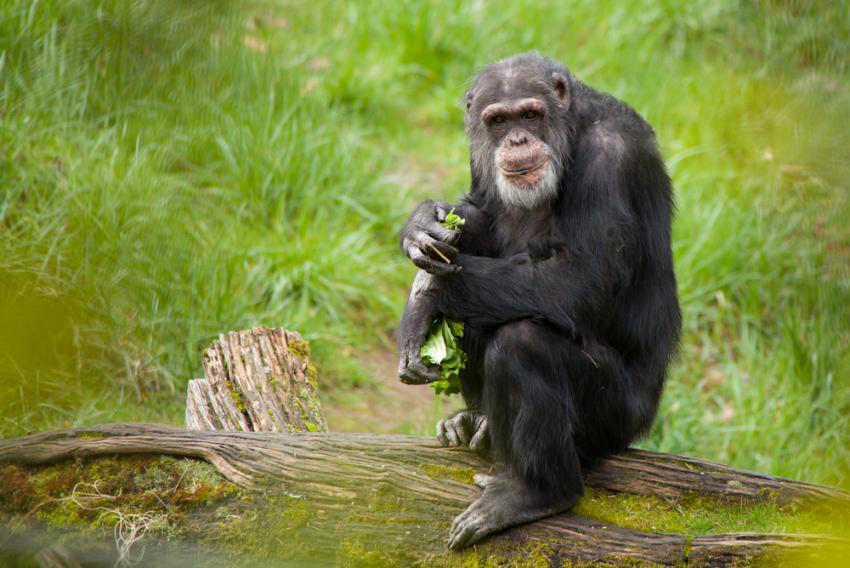

In [28]:
images[0]

We now need to define a `transform` object like we did for MNIST. We will use the same transforms to convert the PIL image to a tensor, and to normalize it. But we also want to resize the images to `height=224, width=224`, because not all of them start out with this size and we need them to be consistent before passing them through our model.

In the normalization step, we'll use a mean of `[0.485, 0.456, 0.406]`, and a standard deviation of `[0.229, 0.224, 0.225]` (these are the mean and std dev of images from [ImageNet](https://www.image-net.org/)). Note that the means and std devs have three elements, because ImageNet contains RGB rather than monochrome images, and we're normalising over each of the three RGB channels separately.


In [29]:
IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORM = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

### Exercise - prepare the data

```c
Difficulty: 🟠⚪⚪⚪⚪
Importance: 🟠🟠🟠⚪⚪

You should spend up to ~5 minutes on this exercise.
```


Now, write a function to prepare the data in `images` to be fed into our model. This should involve preprocessing each image, and stacking them into a single tensor along the batch (0th) dimension.


In [30]:
def prepare_data(images: List[Image.Image]) -> t.Tensor:
    '''
    Return: shape (batch=len(images), num_channels=3, height=224, width=224)
    '''
    images = [IMAGENET_TRANSFORM(image) for image in images]
    return t.stack(images,dim=0)

prepared_images = prepare_data(images)

assert prepared_images.shape == (len(images), 3, IMAGE_SIZE, IMAGE_SIZE)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).



<details>
<summary>Help - I'm not sure how to stack the images.</summary>

Use `t.stack`. The first argument of `t.stack` should be a list of preprocessed images.
</details>
<details>
<summary>Solution</summary>


```python
def prepare_data(images: List[Image.Image]) -> t.Tensor:
    '''
    Return: shape (batch=len(images), num_channels=3, height=224, width=224)
    '''
    # SOLUTION
    x = t.stack([IMAGENET_TRANSFORM(img) for img in images], dim=0)
    return x
```
</details>


Finally, we have provided you with a simple function which predicts the image's category by taking argmax over the output of the model.


In [31]:
def predict(model, images):
    logits: t.Tensor = model(images)
    return logits.argmax(dim=1)

You should use this function to compare your outputs to those of PyTorch's model. Hopefully, you should get the same results! We've also provided you with a file `imagenet_labels.json` which you can use to get the actual classnames of imagenet data, and see what your model's predictions actually are.


In [32]:
with open(section_dir / "imagenet_labels.json") as f:
    imagenet_labels = list(json.load(f).values())

In [33]:
# Check your predictions match the pretrained model's
my_predictions = predict(my_resnet, prepared_images)
pretrained_predictions = predict(pretrained_resnet, prepared_images)
assert all(my_predictions == pretrained_predictions)

Class 367: chimpanzee, chimp, Pan troglodytes


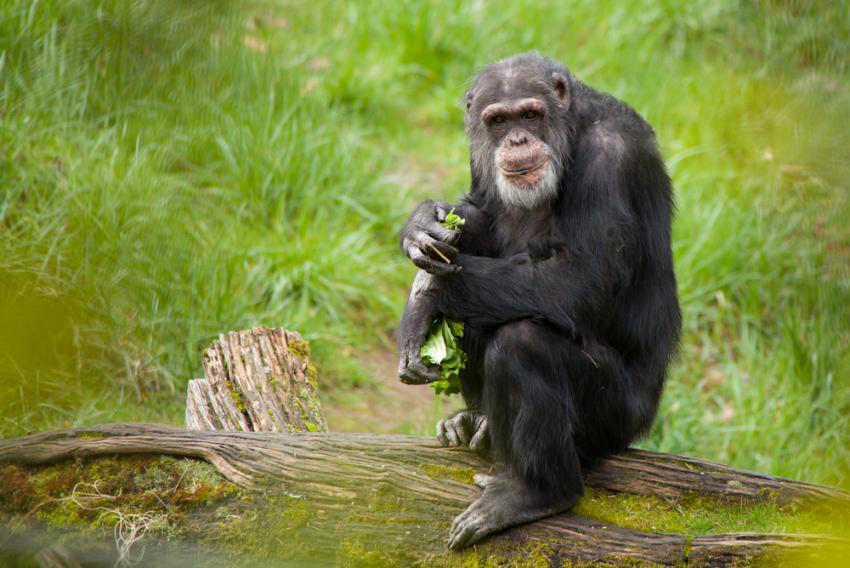


Class 207: golden retriever


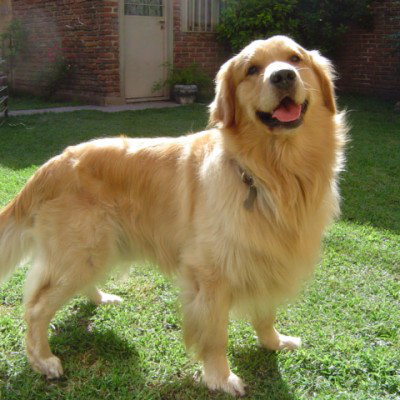


Class 103: platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus


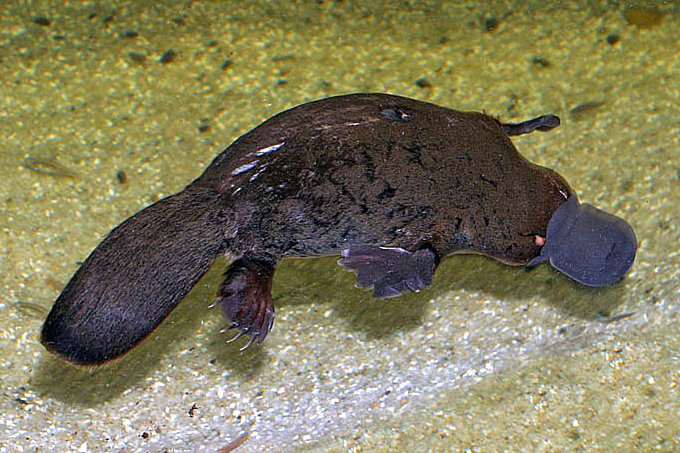


Class 865: toyshop


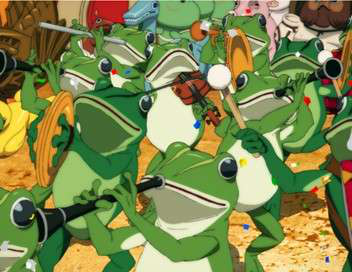


Class 953: pineapple, ananas


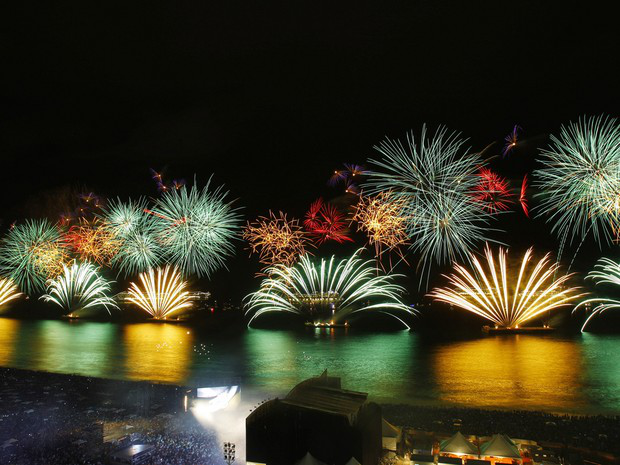


Class 628: liner, ocean liner


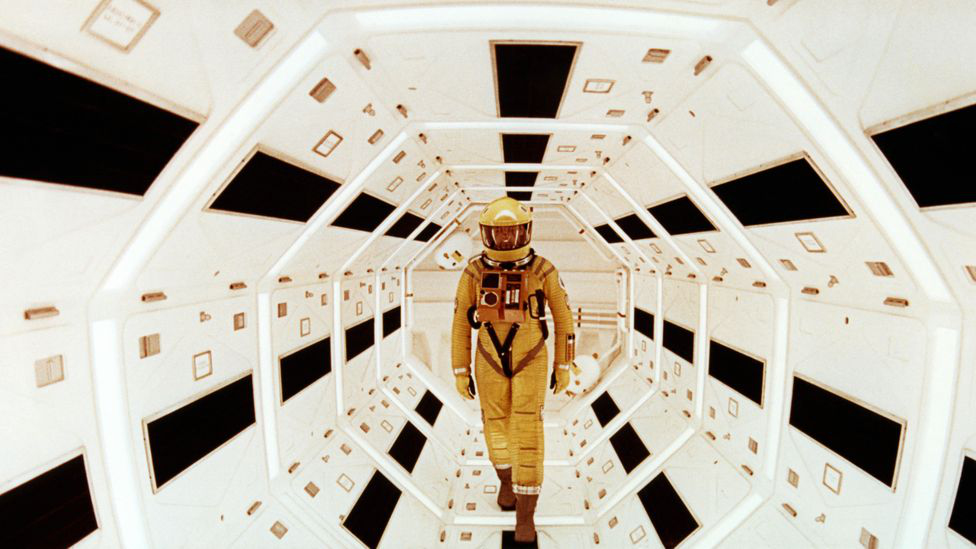


Class 39: common iguana, iguana, Iguana iguana


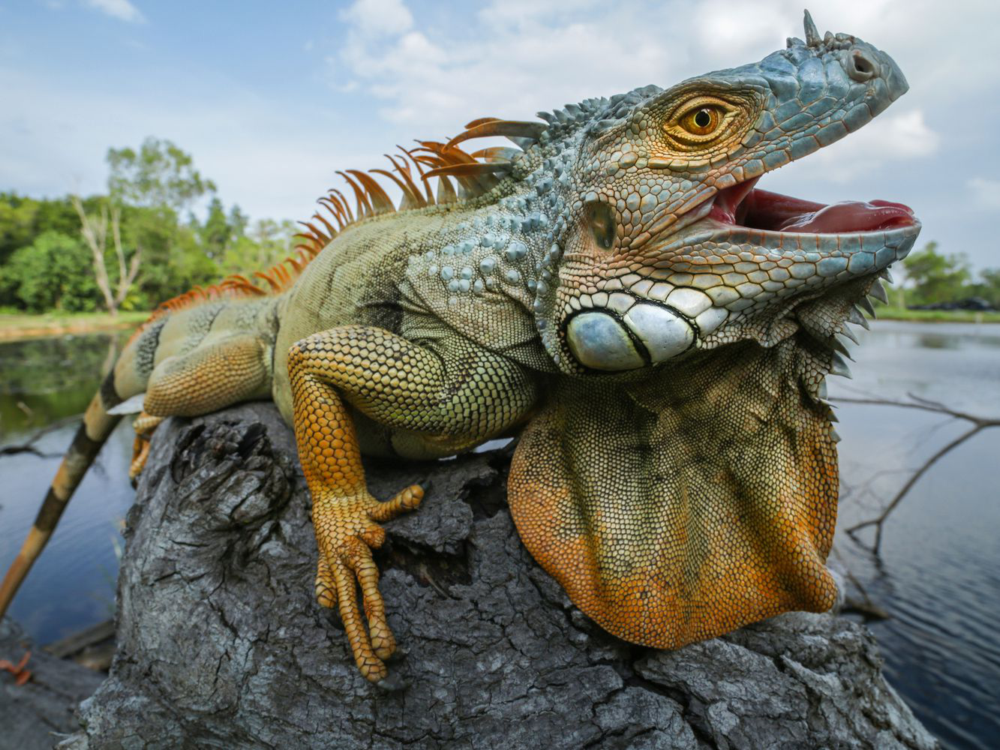


Class 980: volcano


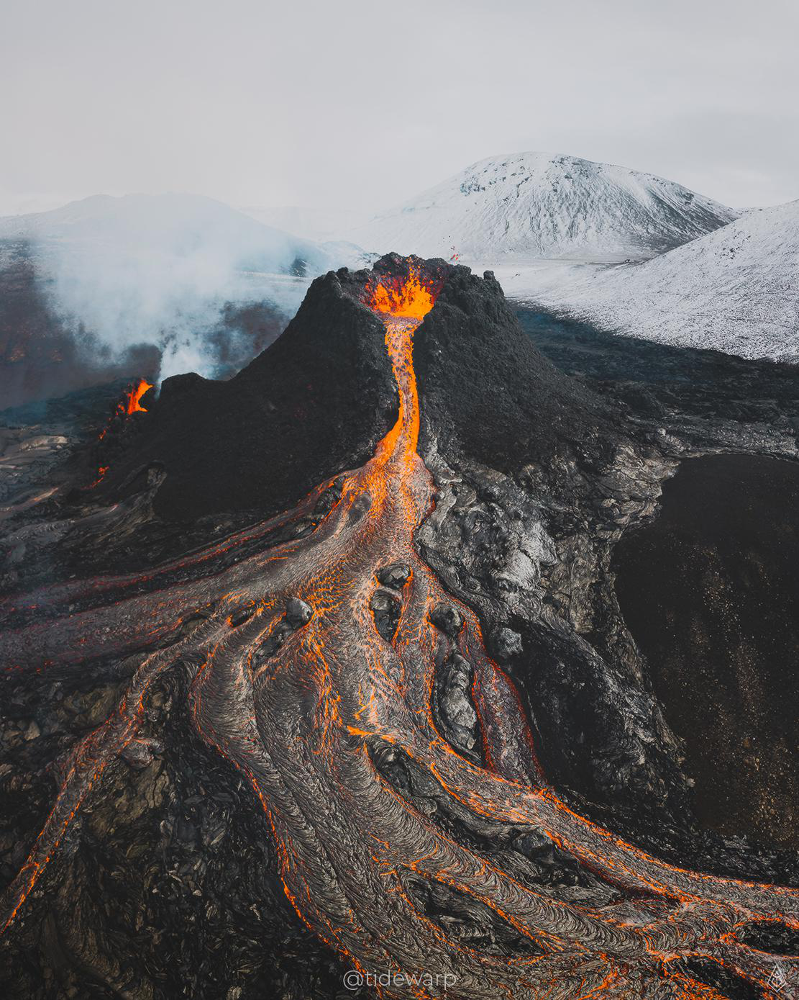


Class 494: chime, bell, gong


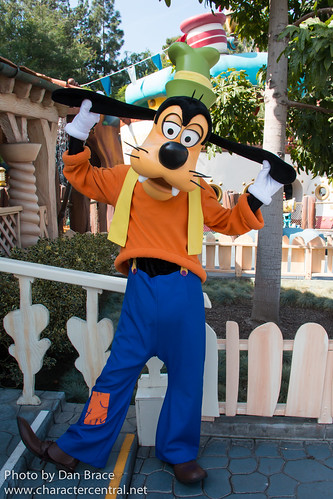


Class 596: hatchet


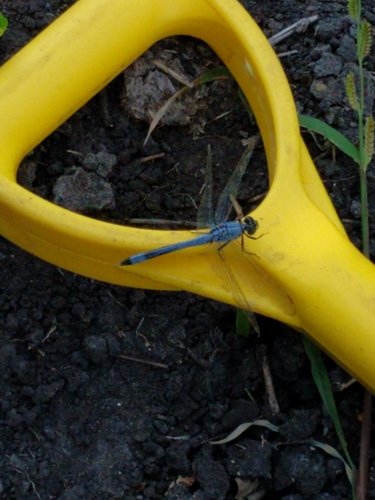

In [34]:
# Print out your predictions, next to the corresponding images
for img, label in zip(images, my_predictions):
    print(f"Class {label}: {imagenet_labels[label]}")
    display(img)
    print()

If you've done everything correctly, your version should give the same classifications, and the percentages should match at least to a couple decimal places.

If it does, congratulations, you've now run an entire ResNet, using barely any code from `torch.nn`! The only things we used were `nn.Module` and `nn.Parameter`.

If it doesn't, you get to practice model debugging! Remember to use the `utils.print_param_count` function that was provided.


<details>
<summary>Help! My model is predicting roughly the same percentage for every category!</summary>

This can indicate that your model weights are randomly initialized, meaning the weight loading process didn't actually take. Or, you reinitialized your model by accident after loading the weights.
</details>


### Aside - hooks

One problem you might have encountered is that your model outputs `NaN`s rather than actual numbers. When debugging this, it's useful to try and identify which module the error first appears in. This is a great use-case for **hooks**, which are something we'll be digging a lot more into during our mechanistic interpretability exercises later on.

A hook is basically a function which you can attach to a particular `nn.Module`, which gets executed during your model's forward or backward passes. Here, we'll only consider forward hooks. A hook function's type signature is:

```python
def hook(module: nn.Module, inputs: List[t.Tensor], output: t.Tensor) -> None:
    pass
```

The `inputs` argument is a list of the inputs to the module (often just one tensor), and the `output` argument is the output of the module. This hook gets registered to a module by calling `module.register_forward_hook(hook)`. During forward passes, the hook function will run.

Here is some code which will check for `NaN`s in the output of each module, and raise a `ValueError` if it finds any. We've also given you an example tiny network which produces a `NaN` in the output of the second layer, to demonstrate it on.


In [35]:
class NanModule(nn.Module):
    '''
    Define a module that always returns NaNs (we will use hooks to identify this error).
    '''
    def forward(self, x):
        return t.full_like(x, float('nan'))

model = nn.Sequential(
    nn.Identity(),
    NanModule(),
    nn.Identity()
)


def hook_check_for_nan_output(module: nn.Module, input: Tuple[t.Tensor], output: t.Tensor) -> None:
    '''
    Hook function which detects when the output of a layer is NaN.
    '''
    if t.isnan(output).any():
        raise ValueError(f"NaN output from {module}")


def add_hook(module: nn.Module) -> None:
    '''
    Register our hook function in a module.

    Use model.apply(add_hook) to recursively apply the hook to model and all submodules.
    '''
    module.register_forward_hook(hook_check_for_nan_output)


def remove_hooks(module: nn.Module) -> None:
    '''
    Remove all hooks from module.

    Use module.apply(remove_hooks) to do this recursively.
    '''
    module._backward_hooks.clear()
    module._forward_hooks.clear()
    module._forward_pre_hooks.clear()


model = model.apply(add_hook)
input = t.randn(3)

try:
    output = model(input)
except ValueError as e:
    print(e)

model = model.apply(remove_hooks)

NaN output from NanModule()


When you run this code, you should find it raising an error at the `NanModule`.


> Important - when you're working with PyTorch hooks, make sure you remember to remove them at the end of each exercise! This is a classic source of bugs, and one of the things that make PyTorch hooks so janky. When we study TransformerLens in the next chapter, we'll use a version of hooks that is essentially the same under the hood, but comes with quite a few quality of life improvements!


# 3️⃣ ResNet feature extraction


> ##### Learning Objectives
> 
> * Understand the difference between feature extraction and finetuning
> * Perform feature extraction on a pre-trained ResNet


Now that you've seen how to build a training loop using PyTorch lightning, and you've seen how ResNet works and is built, we're going to put these two things together to finetune a ResNet model on a new dataset.

**Finetuning** can mean slightly different things in different contexts, but broadly speaking it means using the weights of an already trained network as the starting values for training a new network. Because training networks from scratch is very computationally expensive, this is a common practice in ML.

The specific type of finetuning we'll be doing here is called **feature extraction**. This is when we freeze most layers of a model except the last few, and perform gradient descent on those. We call this feature extraction because the earlier layers of the model have already learned to identify important features of the data (and these features are also relevant for the new task), so all that we have to do is train a few final layers in the model to extract these features. 

*Terminology note - sometimes feature extraction and finetuning are defined differently, with finetuning referring to the training of all the weights in a pretrained model (usually with a small or decaying learning rate), and feature extraction referring to the freezing of some layers and training of others. To avoid confusion here, we'll use the term "feature extraction" rather than "finetuning".*


<img src="https://raw.githubusercontent.com/callummcdougall/computational-thread-art/master/example_images/misc/feature_extraction.png" width="400">


How do we prepare a model for feature extraction? By **freezing layers** of our model.

We'll discuss freezing layers & the backpropagation algorithm in much more detail tomorrow, but for now it's fine to just understand what's going on at a basic level. When we call `loss.backward()` in our training loop (or when this is implicitly called by our PyTorch Lightning trainer), this propagates gradients from our `loss` scalar back to all parameters in our model. If a parameter has its `requires_grad` attribute set to `False`, it means gradients won't be computed for this tensor during backpropagation. Thanks to PyTorch helpfully keeping track of the parameters which require gradients (using a structure called the **computational graph**), if we set `requires_grad = False` for the first few layers of parameters in our model, PyTorch will actually save us time and compute by not calculating gradients for these parameters at all.

See the code below as an example of how gradient propagation stops at tensors with `requires_grad = False`.


In [36]:
layer0, layer1 = nn.Linear(3, 4), nn.Linear(4, 5)

layer0.requires_grad_(False) # generic code to set `param.requires_grad = False` recursively for a module (or entire model)

x = t.randn(3)
out = layer1(layer0(x)).sum()
out.backward()

assert layer0.weight.grad is None
assert layer1.weight.grad is not None

### Exercise - prepare ResNet for feature extraction

```c
Difficulty: 🟠🟠🟠⚪⚪
Importance: 🟠🟠🟠⚪⚪

You should spend up to 15-20 minutes on this exercise.
```


First, you should complete the function below to do the following:

* Instantiate a `ResNet34` model using your class, and copy in weights from a pretrained model (you can use code from earlier here)
* Disable gradients for all layers
* Replace the final linear layer with a new linear layer, which has the same number of `in_features`, but a different number of `out_features` (given by the `n_classes` argument).


In [36]:
def get_resnet_for_feature_extraction(n_classes: int) -> ResNet34:
    '''
    Creates a ResNet34 instance, replaces its final linear layer with a classifier
    for `n_classes` classes, and freezes all weights except the ones in this layer.

    Returns the ResNet model.
    '''
    my_resnet = ResNet34()
    pretrained_resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
    my_resnet = copy_weights(my_resnet, pretrained_resnet)
    my_resnet.requires_grad_(False)
    in_features = my_resnet.linear.in_features
    my_resnet.linear = Linear(in_features=in_features,out_features=n_classes)
    return my_resnet

# my_resnet = ResNet34()
# print(my_resnet.linear)
tests.test_get_resnet_for_feature_extraction(get_resnet_for_feature_extraction)

All tests in `test_get_resnet_for_feature_extraction` passed!


<details>
<summary>Solution</summary>


```python
def get_resnet_for_feature_extraction(n_classes: int) -> ResNet34:
    '''
    Creates a ResNet34 instance, replaces its final linear layer with a classifier
    for `n_classes` classes, and freezes all weights except the ones in this layer.

    Returns the ResNet model.
    '''
    # SOLUTION
    # Create a ResNet34 with the default number of classes
    my_resnet = ResNet34()

    # Load the pretrained weights
    pretrained_resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)

    # Copy the weights over
    my_resnet = copy_weights(my_resnet, pretrained_resnet)

    # Freeze gradients for all layers (note that when we redefine the last layer, it will be unfrozen)
    my_resnet.requires_grad_(False)    

    # Redefine last layer
    my_resnet.out_layers[-1] = Linear(
        my_resnet.out_features_per_group[-1],
        n_classes
    )

    return my_resnet
```
</details>


We'll now give you some boilerplate code to load in and transform your data (this code should be quite familiar to you from the code in section 1).


In [37]:
def get_cifar(subset: int):
    cifar_trainset = datasets.CIFAR10(root='./data', train=True, download=True, transform=IMAGENET_TRANSFORM)
    cifar_testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=IMAGENET_TRANSFORM)

    if subset > 1:
        cifar_trainset = Subset(cifar_trainset, indices=range(0, len(cifar_trainset), subset))
        cifar_testset = Subset(cifar_testset, indices=range(0, len(cifar_testset), subset))
        
    return cifar_trainset, cifar_testset


@dataclass
class ResNetTrainingArgs():
    batch_size: int = 64
    max_epochs: int = 3
    max_steps: int = 500
    optimizer: t.optim.Optimizer = t.optim.Adam
    learning_rate: float = 1e-3
    log_dir: str = os.getcwd() + "/logs"
    log_name: str = "day3-resnet"
    log_every_n_steps: int = 1
    n_classes: int = 10
    subset: int = 10

The dataclass we've defined containing training arguments is basically the same as the one we had for the convnet, the main difference is that we're now using the [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html). This is the dataset we'll be training our model on. It consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. See the link for more information.


### Exercise - write training loop for feature extraction

```c
Difficulty: 🟠🟠🟠⚪⚪
Importance: 🟠🟠🟠🟠⚪

You should spend up to 20-25 minutes on this exercise.
```


Your task is to write a PyTorch Lightning training loop for your ResNet model. Most of this will be exactly the same as for your CNN, except that you'll be swapping out your `ConvNet` for `ResNet34`. There are two main changes you'll have to make, which are specific to the feature extraction problem:

* In the `__init__` method, you'll need to define your model using the `get_resnet_for_feature_extraction` function you wrote above.
* You'll need to define an optimizer to work just on your final linear layer. You can do this by passing a submodule's parameters to the optimizer, rather than the entire model (e.g. `Adam(self.resnet.fc.parameters(), ...)`).

Note that, if you were using vanilla PyTorch, you'd have to call `model.train()` and `model.eval()` to switch between training and eval modes. This is necessary because it changes the behaviour of your BatchNorm. However, PyTorch Lightning does this for you automatically at the start of `training_step` and `validation_step`, so you don't need to worry about this, but it's a useful thing to be aware of.

There is code below to run your training loop, and plot results. You can also compare these results to what you get when you try to train the model from scratch.

<details>
<summary>Spoilers - what kind of results should you get?</summary>

If you train the whole model rather than just the final layer, you should find accuracy increases very slowly, not getting very far above random chance. This reflects the fact that the model is trying to learn a new task (classifying images into 10 classes) from scratch, rather than just learning to extract features from images, and this takes a long time!

If you train just the final layer, your accuracy should reach around 70-80% by the first epoch. This is because the model is already very good at extracting features from images, and it just needs to learn how to turn these features into predictions for this new set of classes.
</details>


In [41]:
class LitResNet(pl.LightningModule):
    def __init__(self, args: ResNetTrainingArgs):
        super().__init__()
        self.args = args
        self.resnet = get_resnet_for_feature_extraction(n_classes=args.n_classes)
        self.trainset, self.testset = get_cifar(subset=args.subset)

    def forward(self, x: t.Tensor) -> t.Tensor:
        return self.resnet(x)

    def _shared_train_val_step(self, batch: Tuple[Tensor, Tensor]) -> Tuple[Tensor, Tensor]:
        imgs,labels = batch
        logits = self(imgs)
        return logits,labels        

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> t.Tensor:
        logits,labels = self._shared_train_val_step(batch)
        loss = F.cross_entropy(logits,labels)
        self.log("train_loss",loss)
        return loss

    def validation_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> None:
        logits,labels = self._shared_train_val_step(batch)
        # logits have shape [batch, n_classes]
        preds = t.argmax(logits,dim=1) # The predicted class for each image in the batch
        num_correct = (preds == labels).sum()
        acc = num_correct/preds.shape[0]
        self.log("accuracy",acc)

    def configure_optimizers(self):
        return self.args.optimizer(self.resnet.linear.parameters(), lr=self.args.learning_rate)

    def train_dataloader(self):
        return DataLoader(self.trainset,batch_size=self.args.batch_size,shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.testset,batch_size=self.args.batch_size,shuffle=False)

args = ResNetTrainingArgs()
model = LitResNet(args)
logger = CSVLogger(save_dir=args.log_dir, name=args.log_name)

trainer = pl.Trainer(
    max_epochs=args.max_epochs,
    logger=logger,
    log_every_n_steps=args.log_every_n_steps
)
trainer.validate(model=model)
trainer.fit(model=model)

metrics = pd.read_csv(f"{trainer.logger.log_dir}/metrics.csv")

plot_train_loss_and_test_accuracy_from_metrics(metrics, "Feature extraction with ResNet34")

Files already downloaded and verified
Files already downloaded and verified


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         accuracy          │    0.15000000596046448    │
└───────────────────────────┴───────────────────────────┘

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name   | Type     | Params
------------------------------------
0 | resnet | ResNet34 | 21.3 M
------------------------------------
5.1 K     Trainable params
21.3 M    Non-trainable params
21.3 M    Total params
85.159    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [40]:
plot_train_loss_and_test_accuracy_from_metrics(metrics, "Feature extraction with ResNet34")

<details>
<summary>Solution</summary>


```python
class LitResNet(pl.LightningModule):
    def __init__(self, args: ResNetTrainingArgs):
        super().__init__()
        # SOLUTION
        self.args = args
        self.resnet = get_resnet_for_feature_extraction(self.args.n_classes)
        self.trainset, self.testset = get_cifar(subset=self.args.subset)

    def forward(self, x: t.Tensor) -> t.Tensor:
        # SOLUTION
        return self.resnet(x)

    def _shared_train_val_step(self, batch: Tuple[Tensor, Tensor]) -> Tuple[Tensor, Tensor]:
        # SOLUTION
        imgs, labels = batch
        logits = self(imgs)
        return logits, labels

    def training_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> t.Tensor:
        # SOLUTION
        logits, labels = self._shared_train_val_step(batch)
        loss = F.cross_entropy(logits, labels)
        self.log("train_loss", loss)
        return loss
    
    def validation_step(self, batch: Tuple[Tensor, Tensor], batch_idx: int) -> None:
        # SOLUTION
        logits, labels = self._shared_train_val_step(batch)
        classifications = logits.argmax(dim=1)
        accuracy = t.sum(classifications == labels) / len(classifications)
        self.log("accuracy", accuracy)

    def configure_optimizers(self):
        # SOLUTION
        return self.args.optimizer(self.resnet.out_layers.parameters(), lr=self.args.learning_rate)
    
    def train_dataloader(self):
        # SOLUTION
        return DataLoader(self.trainset, batch_size=self.args.batch_size, shuffle=True)
    
    def val_dataloader(self):
        # SOLUTION
        return DataLoader(self.testset, batch_size=self.args.batch_size, shuffle=True)
```
</details>


<details>
<summary>Question - can you guess what would happen if you passed only the last layer of params into your optimizer, but you <i>didn't</i> freeze gradients of previous layers?</summary>

Only the last layer of parameters will be *updated*, but gradients will be propogated back through all the parameters (meaning backward passes will take a very long time).

You'll understand this more once we do the exercises from day 5 (backpropagation).
</details>


Congratulations for finishing the exercises! 

Tomorrow, we'll dig a bit deeper into training and optimizers, and we'll end by training a ResNet from scratch on data from ImageNet.
